In [5]:
# %pip install wandb -q
from wandb.keras import WandbCallback
import wandb
wandb.login()

True

In [3]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

In [4]:
NUM_CLASS = 70

npz_dataset = np.load('dataset_emoji_apple_small.npz')
print(npz_dataset.files)
train_images = npz_dataset['data'][:NUM_CLASS]
train_labels = npz_dataset['labels'][:NUM_CLASS]


print(f"Shape of the images in the dataset: {train_images.shape}")


train_images = train_images.astype("float32")
train_images = (train_images - 127.5) / 127.5

['data', 'labels']
Shape of the images in the dataset: (70, 28, 28, 4)


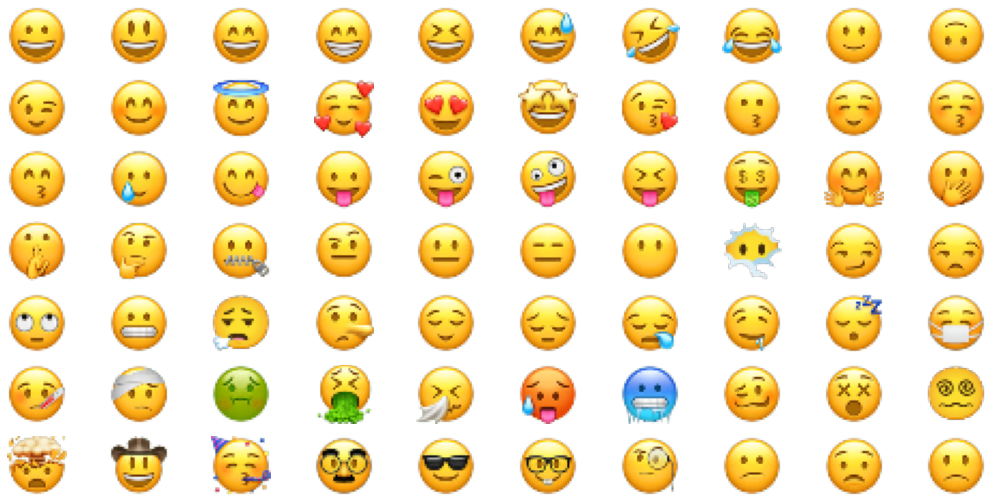

In [6]:
fig, axes = plt.subplots(NUM_CLASS//10,10, figsize=(18,9))
for idx, ax in enumerate(axes.flat):
    ax.imshow((train_images[idx] + 1) / 2)
    ax.axis('off')
plt.show()

In [7]:
def discriminator_part(num_class, img_shape, using_infogan):
    inp = tf.keras.layers.Input(shape=img_shape)
    
    x = tf.keras.layers.Conv2D(32, (3,3), padding='same')(inp)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)

    x = tf.keras.layers.Conv2D(64, (3,3), strides=(2,2), padding='same')(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)

    x = tf.keras.layers.Conv2D(128, (3,3), strides=(2,2), padding='same')(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)

    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    
    out_bin = tf.keras.layers.Dense(1)(x)

    out_cat = out_bin
    if using_infogan:
        x = tf.keras.layers.Dense(128)(x)
        x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
        out_cat = tf.keras.layers.Dense(num_class, activation='sigmoid')(x)

    model = tf.keras.models.Model(inp, [out_bin, out_cat])
    return model


tmp_model = discriminator_part(70,(28,28,4), True)
tmp_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 28, 28, 4)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 28, 28, 32)   1184        ['input_1[0][0]']                
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 28, 28, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 14, 14, 64)   18496       ['leaky_re_lu[0][0]']            
                                                                                              

In [8]:
def generator_part(latent_size, using_upsampling):
    inp = tf.keras.layers.Input(shape=(latent_size,))
    x = tf.keras.layers.Dense(128 * 7 * 7)(inp)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    x = tf.keras.layers.Reshape((7, 7, 128))(x)

    if not using_upsampling:
        x = tf.keras.layers.Conv2DTranspose(64, (4,4), strides=(2,2), padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)

        x = tf.keras.layers.Conv2DTranspose(64, (4,4), strides=(2,2), padding='same')(x)
        x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)

    if using_upsampling:
        x = tf.keras.layers.UpSampling2D((2,2))(x)
        x = tf.keras.layers.Conv2D(64, (4,4), padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)

        x = tf.keras.layers.UpSampling2D((2,2))(x)
        x = tf.keras.layers.Conv2D(64, (4,4), padding='same')(x)        
        x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)


    out = tf.keras.layers.Conv2D(4, (3,3), activation='tanh', padding='same')(x)
    model = tf.keras.models.Model(inp, out)
    return model


tmp_model = generator_part(latent_size=175, using_upsampling=True)
tmp_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 175)]             0         
                                                                 
 dense_3 (Dense)             (None, 6272)              1103872   
                                                                 
 batch_normalization (BatchN  (None, 6272)             25088     
 ormalization)                                                   
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 6272)              0         
                                                                 
 reshape (Reshape)           (None, 7, 7, 128)         0         
                                                                 
 up_sampling2d (UpSampling2D  (None, 14, 14, 128)      0         
 )                                                         

In [16]:
@tf.function
def generate_latent_vectors(batch_size, l_dim, c_dim, u_dim, using_infogan, from_plot=False):
    rndm_l_vectors = tf.random.normal(shape=(batch_size, l_dim))
    rndm_c_vectors = tf.zeros(batch_size)

    rndm_ltnt_vec = rndm_l_vectors
    if using_infogan:
        if not from_plot:
            rndm_c_vectors = tf.experimental.numpy.random.randint(c_dim, size=[batch_size])

        else :
            rndm_c_vectors = tf.concat([tf.range(70, dtype=tf.int64), 
                                        tf.experimental.numpy.random.randint(c_dim, 
                                                                             size=[batch_size-70])], axis=0)

        rndm_c_vectors = tf.one_hot(rndm_c_vectors, c_dim)
        rndm_u_vectors = tf.random.uniform(shape=(batch_size, u_dim), minval=-1, maxval=1)
        rndm_ltnt_vec = tf.concat([rndm_l_vectors, rndm_c_vectors, rndm_u_vectors], axis=1)

    return rndm_ltnt_vec, rndm_c_vectors

In [10]:
class GAN(tf.keras.Model):
    def __init__(self, discriminator, generator, latent_dim, class_dim, 
                 uni_dim, using_infogan, using_grdnt_pnlt ,
                 pos_lbl_smooth, neg_lbl_smooth, add_noise, using_wgan_loss):
        
        super(GAN, self).__init__()
        self.discriminator    = discriminator
        self.generator        = generator
        self.latent_dim       = latent_dim
        self.class_dim        = class_dim
        self.uni_dim          = uni_dim
        self.using_infogan    = using_infogan
        self.using_grdnt_pnlt = using_grdnt_pnlt
        self.pos_lbl_smooth   = pos_lbl_smooth
        self.neg_lbl_smooth   = neg_lbl_smooth
        self.add_noise        = add_noise
        self.using_wgan_loss  = using_wgan_loss


    def compile(self, dis_opt, func_dis_loss, func_dis_loss_lbl, 
                gen_opt, func_gen_loss, func_gen_loss_lbl):
        
        super(GAN, self).compile()
        self.dis_opt           = dis_opt
        self.func_dis_loss     = func_dis_loss
        self.func_dis_loss_lbl = func_dis_loss_lbl
        self.gen_opt           = gen_opt
        self.func_gen_loss     = func_gen_loss
        self.func_gen_loss_lbl = func_gen_loss_lbl


    def gradient_penalty(self, batch_size, real_images, fake_images, lambda_factor=10):
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            pred = self.discriminator(interpolated, training=True)

        grads = gp_tape.gradient(pred, [interpolated])[0]
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return lambda_factor * gp


    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_labels = real_images[1]
            real_images = real_images[0]

        batch_size = tf.shape(real_images)[0]
        rndm_ltnt_vec, rndm_lbl_vec = generate_latent_vectors(batch_size, self.latent_dim, 
                                                              self.class_dim, self.uni_dim, 
                                                              self.using_infogan)
        
        with tf.GradientTape() as tape:
            fake_images = self.generator(rndm_ltnt_vec, training=False) 
            fake_logits, prd_fake_lbl = self.discriminator(fake_images, training=True) 
            real_logits, prd_real_lbl = self.discriminator(real_images, training=True) 
            dis_loss, dis_acc = self.func_dis_loss(real_img = real_logits, fake_img = fake_logits, 
                                                   add_noise = self.add_noise ,
                                                   positive_label_smoothing = self.pos_lbl_smooth, 
                                                   negetive_label_smoothing = self.neg_lbl_smooth,
                                                   using_wgan_loss = self.using_wgan_loss)
            dis_loss_lbl = 0
            if self.using_infogan:
                dis_loss_lbl += self.func_dis_loss_lbl(real_lbl=real_labels, prd_real_lbl=prd_real_lbl, 
                                                       fake_lbl=rndm_lbl_vec, prd_fake_lbl=prd_fake_lbl)

            gp_loss = 0
            if self.using_grdnt_pnlt:
                gp_loss = self.gradient_penalty(batch_size, real_images, fake_images)

            dis_loss = dis_loss + dis_loss_lbl + gp_loss
        d_gradient = tape.gradient(dis_loss, self.discriminator.trainable_variables)
        if self.using_wgan_loss : 
            d_gradient = [
                            tf.clip_by_value(d_g, clip_value_min=-0.01, clip_value_max=0.01) 
                            for d_g in d_gradient
                            ]  

        self.dis_opt.apply_gradients(
            zip(d_gradient, self.discriminator.trainable_variables)
        )

        rndm_ltnt_vec, rndm_lbl_vec = generate_latent_vectors(batch_size, self.latent_dim, 
                                                              self.class_dim,self.uni_dim,self.using_infogan)
        with tf.GradientTape() as tape:
            generated_images = self.generator(rndm_ltnt_vec, training=True)
            gen_img_logits, prd_lbl_img = self.discriminator(generated_images, training=False)
            gen_loss, gen_acc = self.func_gen_loss(gen_img_logits, 
                                               positive_label_smoothing = self.pos_lbl_smooth, 
                                               add_noise = self.add_noise, 
                                               using_wgan_loss = self.using_wgan_loss)

            gen_loss_lbl = 0
            if self.using_infogan:
                gen_loss_lbl = self.func_gen_loss_lbl(rndm_lbl=rndm_lbl_vec, prd_rndm_lbl=prd_lbl_img)
            gen_loss = gen_loss + gen_loss_lbl
        gen_gradient = tape.gradient(gen_loss, self.generator.trainable_variables)
        self.gen_opt.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )

        return {"dis_loss": dis_loss, "dis_acc": dis_acc, "gen_loss": gen_loss, "gen_acc":gen_acc}

In [11]:
class CheckPoint_Plot(tf.keras.callbacks.Callback): 
    def __init__(self, train_images, using_infogan, num_img, latent_dim, class_dim, 
                 uni_dim, check_point = 50):
        self.num_img = num_img + num_img*(1-using_infogan)
        self.latent_dim = latent_dim
        self.class_dim = class_dim
        self.uni_dim = uni_dim
        self.train_images = (train_images + 1) / 2
        self.check_point = check_point
        self.using_infogan = using_infogan


    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.check_point == 0:
            rndm_ltnt_vec, rndm_lbl_vec = generate_latent_vectors(self.num_img, 
                                                                  self.latent_dim, 
                                                                  self.class_dim, 
                                                                  self.uni_dim, 
                                                                  self.using_infogan, 
                                                                  from_plot=True)
           
            if self.using_infogan:
                lbl_gen_img = np.argmax(rndm_lbl_vec.numpy(), axis=1)

            generated_images = self.model.generator(rndm_ltnt_vec)
            generated_images = (generated_images + 1) / 2

            fig = plt.figure(figsize=(18, 9))
            n = self.num_img * (2 if self.using_infogan else 1)
            m = n ** 0.5
            for i in range(0,n,2):
                ax1 = fig.add_subplot(m,m,i+1)
                ax1.axis('off')


                ax2 = fig.add_subplot(m,m,i+2)
                ax2.axis('off')
                img = generated_images[i//2].numpy()
                ax2.imshow(img)

        
                if self.using_infogan:
                    ax1.imshow(self.train_images[lbl_gen_img[i//2]])
                    ax1.set_title('Original', fontsize=6)
                    ax2.set_title('Generated', fontsize=6)

                else:
                    ax1.imshow(generated_images[i//2+1].numpy())


            fig.tight_layout()
            plt.show()

In [12]:
bin_acc = tf.keras.metrics.BinaryAccuracy()
def compute_accuracy(y_true, y_pred):
    bin_acc.update_state(y_true, y_pred)
    res_acc = bin_acc.result()
    bin_acc.reset_state()
    return res_acc


def discriminator_loss(real_img, fake_img, add_noise, 
                       positive_label_smoothing,
                       negetive_label_smoothing,
                       using_wgan_loss
                       ):
    total_loss = 0
    y_real_img = tf.ones_like(real_img)
    y_fake_img = tf.zeros_like(fake_img)

    if add_noise:
        y_real_img = tf.random.categorical(tf.math.log([[0.05, 0.95]]), tf.shape(y_real_img)[0])
        y_real_img = tf.cast(y_real_img, tf.float32)

        y_fake_img = tf.random.categorical(tf.math.log([[0.95, 0.05]]), tf.shape(y_fake_img)[0])
        y_fake_img = tf.cast(y_fake_img, tf.float32)

    if positive_label_smoothing:
        y_real_img += tf.random.uniform(shape=tf.shape(y_real_img), minval=-0.2, maxval=0.2)

    if negetive_label_smoothing:
        y_fake_img += tf.random.uniform(shape=tf.shape(y_fake_img), minval=0, maxval=0.2)

    y_real_img = tf.reshape(y_real_img, [-1,1])
    y_fake_img = tf.reshape(y_fake_img, [-1,1])

    if not using_wgan_loss:
        real_loss = tf.reduce_mean((real_img - y_real_img) ** 2)
        fake_loss = tf.reduce_mean((fake_img - y_fake_img) ** 2)
        total_loss = 0.5*(real_loss + fake_loss)
    
    if using_wgan_loss:
        total_loss = (tf.reduce_mean(real_img) - tf.reduce_mean(fake_img))

    real_acc = compute_accuracy(tf.ones_like(real_img), real_img)
    fake_acc = compute_accuracy(tf.zeros_like(fake_img), fake_img)
    total_acc = 0.5*(real_acc+fake_acc)
    return total_loss, total_acc



def discriminator_loss_label(real_lbl, prd_real_lbl, fake_lbl, prd_fake_lbl):
    cat_cross_entropy = tf.keras.losses.CategoricalCrossentropy()
    real_loss = cat_cross_entropy(real_lbl , prd_real_lbl)
    fake_loss = cat_cross_entropy(fake_lbl , prd_fake_lbl)
    total_loss = 0.5*(real_loss + fake_loss)
    return total_loss



def generator_loss(fake_img, add_noise, positive_label_smoothing, using_wgan_loss):
    res_loss = 0
    y_fake_img = tf.ones_like(fake_img)
    if add_noise:
        y_fake_img = tf.random.categorical(tf.math.log([[0.05, 0.95]]), tf.shape(y_fake_img)[0])
        y_fake_img = tf.cast(y_fake_img, tf.float32)
    if positive_label_smoothing:
        y_fake_img += tf.random.uniform(shape=tf.shape(y_fake_img), minval=-0.2, maxval=0.2)
    y_fake_img = tf.reshape(y_fake_img, [-1,1])

    if not using_wgan_loss:
        res_loss = tf.reduce_mean((fake_img - y_fake_img) ** 2)

    if using_wgan_loss:
        res_loss = tf.reduce_mean(fake_img)
    
    res_acc = compute_accuracy(tf.ones_like(fake_img), fake_img) 
    return res_loss, res_acc



def generator_loss_label(rndm_lbl, prd_rndm_lbl):
    cat_cross_entropy = tf.keras.losses.CategoricalCrossentropy()
    return cat_cross_entropy(rndm_lbl , prd_rndm_lbl)

In [13]:
def benchmark(X_train, y_train, BATCH_SIZE, EPOCHS, 
              LATENT_DIM, NUM_CLASS, UNIFORM_DIM, 
              GRADIENT_PENALTY, UPSAMPLING_LAYER, INFO_GAN, 
              POS_LBL_SMOOTH, NEG_LBL_SMOOTH, ADD_NOISE, WGAN_LOSS,
              OPTIMIZER = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)):

    IMG_SHAPE = X_train.shape[1:]
    BATCH_SIZE = BATCH_SIZE
    EPOCHS = EPOCHS

    GRADIENT_PENALTY = GRADIENT_PENALTY
    UPSAMPLING_LAYER = UPSAMPLING_LAYER
    INFO_GAN = INFO_GAN

    POS_LBL_SMOOTH = POS_LBL_SMOOTH
    NEG_LBL_SMOOTH = NEG_LBL_SMOOTH
    ADD_NOISE = ADD_NOISE
    WGAN_LOSS = WGAN_LOSS

    LATENT_DIM = LATENT_DIM
    NUM_CLASS = NUM_CLASS
    UNIFORM_DIM = UNIFORM_DIM
    INPUT_GENERATOR_DIM = LATENT_DIM + (NUM_CLASS+UNIFORM_DIM) * INFO_GAN

    chk_pnt_plt = CheckPoint_Plot(num_img       = 72, 
                                  check_point   = 150,
                                  latent_dim    = LATENT_DIM,
                                  class_dim     = NUM_CLASS,
                                  uni_dim       = UNIFORM_DIM,
                                  train_images  = train_images,
                                  using_infogan = INFO_GAN)

    gan = GAN(
        discriminator    = discriminator_part(num_class = NUM_CLASS , 
                                              img_shape = IMG_SHAPE, 
                                              using_infogan=INFO_GAN),
        generator        = generator_part(latent_size = INPUT_GENERATOR_DIM, 
                                          using_upsampling = UPSAMPLING_LAYER),
        latent_dim       = LATENT_DIM,
        class_dim        = NUM_CLASS,
        uni_dim          = UNIFORM_DIM, 
        using_infogan    = INFO_GAN,
        using_grdnt_pnlt = GRADIENT_PENALTY,
        pos_lbl_smooth   = POS_LBL_SMOOTH,
        neg_lbl_smooth   = NEG_LBL_SMOOTH,
        add_noise        = ADD_NOISE,
        using_wgan_loss  = WGAN_LOSS,
    )

    gen_opt = OPTIMIZER
    dis_opt = OPTIMIZER
    if WGAN_LOSS:
        gen_opt = tf.keras.optimizers.RMSprop(5e-4)
        dis_opt = tf.keras.optimizers.RMSprop(5e-4) 

    gan.compile(
        dis_opt           = dis_opt,
        func_dis_loss     = discriminator_loss,
        func_dis_loss_lbl = discriminator_loss_label,
        gen_opt           = gen_opt,
        func_gen_loss     = generator_loss,
        func_gen_loss_lbl = generator_loss_label,
    )
    gan.fit(X_train, y_train, batch_size=BATCH_SIZE, epochs=EPOCHS, callbacks=[chk_pnt_plt, WandbCallback()])

In [14]:
NUM_REPEAT = 100

r_train_images = np.repeat(train_images, NUM_REPEAT, axis=0)
print(f"Shape of train_images in dataset: {r_train_images.shape}")

r_train_labels = np.repeat(train_labels, NUM_REPEAT, axis=0)
r_train_labels = tf.keras.utils.to_categorical(r_train_labels, num_classes=NUM_CLASS)
train_labels = tf.keras.utils.to_categorical(train_labels, num_classes=NUM_CLASS)
print(f"Shape of train_labels in dataset: {r_train_labels.shape}")

Shape of train_images in dataset: (7000, 28, 28, 4)
Shape of train_labels in dataset: (7000, 70)


wandb: Currently logged in as: mahdifarzandway (use `wandb login --relogin` to force relogin)


Epoch 1/302
55/55 [==============================] - ETA: 0s - dis_loss: 0.0451 - dis_acc: 0.9650 - gen_loss: 0.1900 - gen_acc: 0.7762

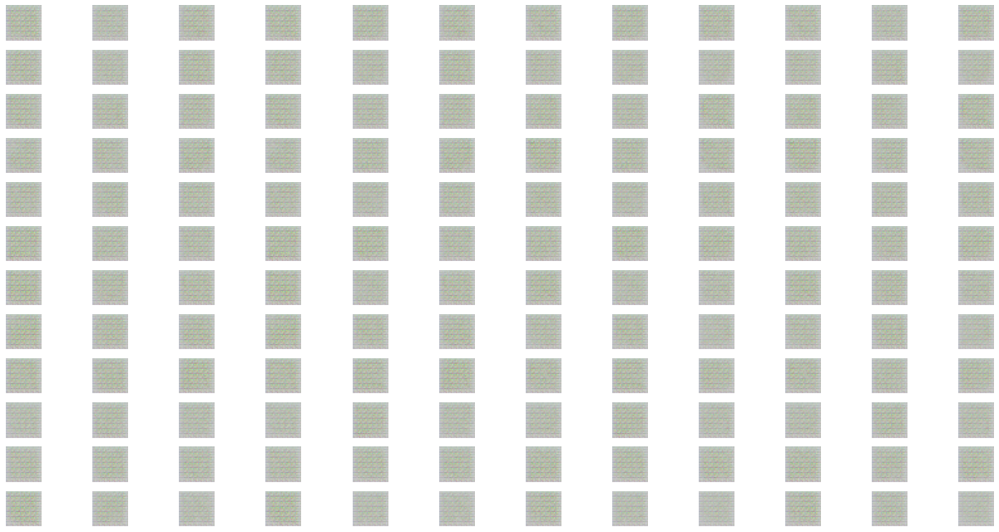

55/55 [==============================] - 18s 113ms/step - dis_loss: 0.0444 - dis_acc: 0.9656 - gen_loss: 0.1893 - gen_acc: 0.7800
Epoch 2/302
55/55 [==============================] - 2s 34ms/step - dis_loss: 0.0069 - dis_acc: 1.0000 - gen_loss: 0.0491 - gen_acc: 0.9992
Epoch 3/302
55/55 [==============================] - 2s 32ms/step - dis_loss: 0.0030 - dis_acc: 1.0000 - gen_loss: 0.0011 - gen_acc: 1.0000
Epoch 4/302
55/55 [==============================] - 2s 33ms/step - dis_loss: 0.0024 - dis_acc: 1.0000 - gen_loss: 0.0010 - gen_acc: 1.0000
Epoch 5/302
55/55 [==============================] - 2s 32ms/step - dis_loss: 0.0042 - dis_acc: 1.0000 - gen_loss: 0.0156 - gen_acc: 1.0000
Epoch 6/302
55/55 [==============================] - 2s 32ms/step - dis_loss: 0.0036 - dis_acc: 1.0000 - gen_loss: 0.0079 - gen_acc: 1.0000
Epoch 7/302
55/55 [==============================] - 2s 33ms/step - dis_loss: 0.0047 - dis_acc: 1.0000 - gen_loss: 0.0078 - gen_acc: 1.0000
Epoch 8/302
55/55 [===========

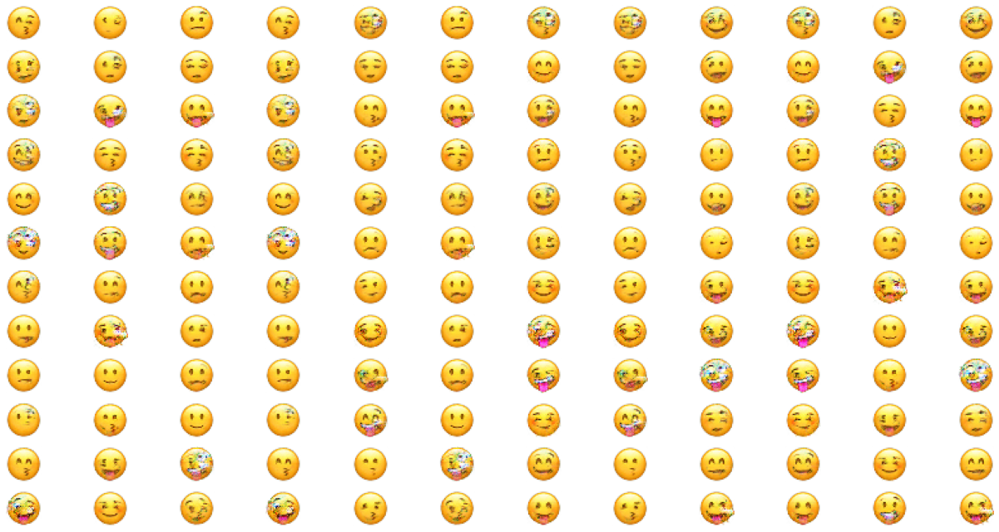

55/55 [==============================] - 6s 108ms/step - dis_loss: 0.0471 - dis_acc: 0.9746 - gen_loss: 0.8415 - gen_acc: 0.0027
Epoch 152/302
55/55 [==============================] - 2s 36ms/step - dis_loss: 0.0476 - dis_acc: 0.9750 - gen_loss: 0.8562 - gen_acc: 0.0017
Epoch 153/302
55/55 [==============================] - 2s 34ms/step - dis_loss: 0.0434 - dis_acc: 0.9794 - gen_loss: 0.8573 - gen_acc: 0.0018
Epoch 154/302
55/55 [==============================] - 2s 35ms/step - dis_loss: 0.0481 - dis_acc: 0.9730 - gen_loss: 0.8504 - gen_acc: 0.0024
Epoch 155/302
55/55 [==============================] - 2s 34ms/step - dis_loss: 0.0408 - dis_acc: 0.9840 - gen_loss: 0.8680 - gen_acc: 6.9754e-04
Epoch 156/302
55/55 [==============================] - 2s 35ms/step - dis_loss: 0.0460 - dis_acc: 0.9748 - gen_loss: 0.8569 - gen_acc: 0.0031
Epoch 157/302
55/55 [==============================] - 2s 35ms/step - dis_loss: 0.0431 - dis_acc: 0.9774 - gen_loss: 0.8587 - gen_acc: 0.0020
Epoch 158/302
5

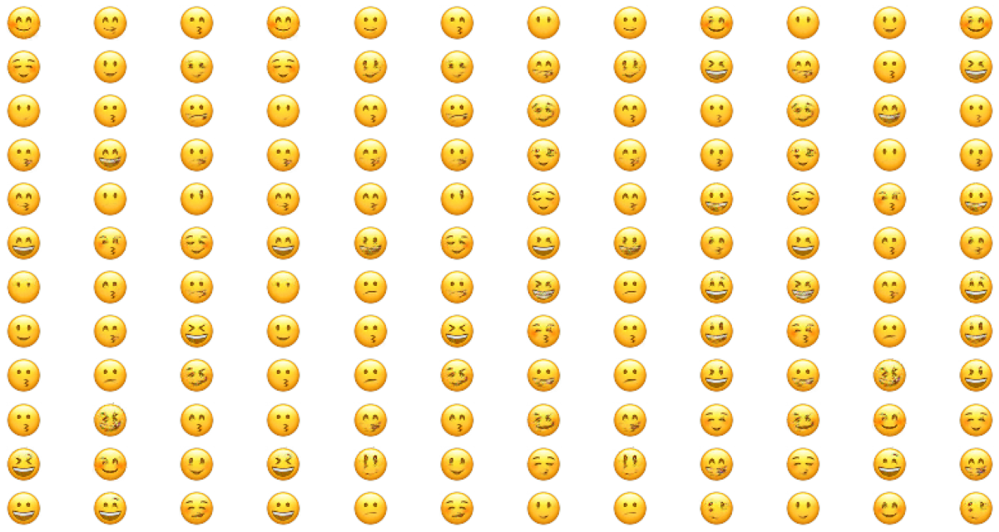

55/55 [==============================] - 6s 110ms/step - dis_loss: 0.0418 - dis_acc: 0.9684 - gen_loss: 0.8740 - gen_acc: 0.0011
Epoch 302/302
55/55 [==============================] - 2s 36ms/step - dis_loss: 0.0407 - dis_acc: 0.9702 - gen_loss: 0.8818 - gen_acc: 0.0022
CPU times: user 6min 23s, sys: 21.1 s, total: 6min 44s
Wall time: 10min 31s


In [18]:
%%time

wandb.init(name='DCGAN',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302, 
          OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 2e-4, beta_1 = .5),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = False, UPSAMPLING_LAYER = False, INFO_GAN = False, 
          POS_LBL_SMOOTH = False, NEG_LBL_SMOOTH = False, ADD_NOISE = False, WGAN_LOSS = False)

dis_acc,██▅▆▃▇▆▂▇▄█▆▁▆▆▆▆▆▅█▇▇▇▄▆▆▅▅▇▇█▆▅▇▆▆▆▃▅▆
dis_loss,▁▃▇▆▇▆▆▆▅▆▅▅█▄▅▅▄▅▅▃▄▄▃▅▄▄▅▄▄▄▃▄▄▄▄▅▄▇▅▅
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_acc,█▇▁▁▃▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
gen_loss,▁▂▅▄▃▅▆▅▆▄▇█▇▆▄▆▅▆▆▇▇▇▅▆▇█▅▆▆▆▆▅▅▇▅▇▇▇▆▇
dis_acc,0.97727
dis_loss,0.03673
epoch,301
gen_acc,0.0
gen_loss,1.00357


Epoch 1/302
55/55 [==============================] - ETA: 0s - dis_loss: 1.2620 - dis_acc: 0.9381 - gen_loss: 0.1287 - gen_acc: 0.8328

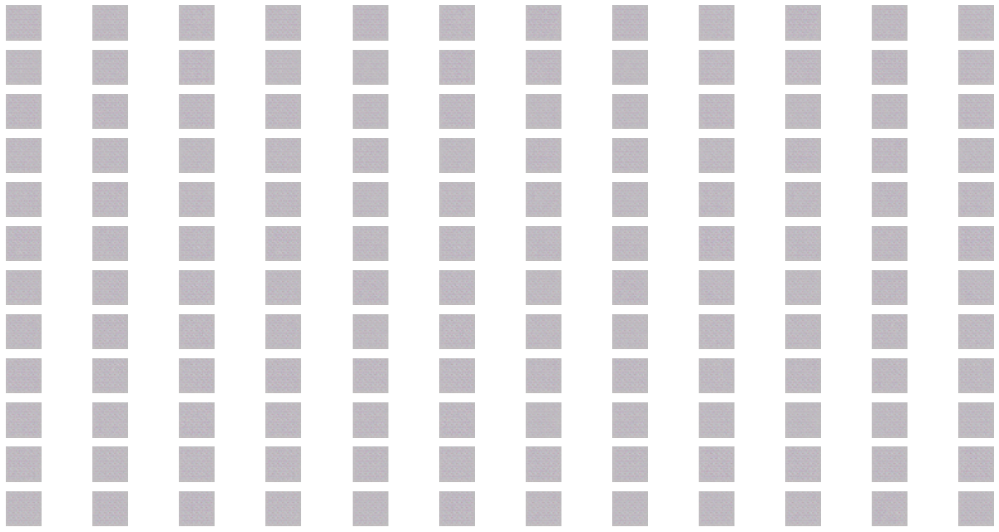

55/55 [==============================] - 8s 118ms/step - dis_loss: 1.2406 - dis_acc: 0.9392 - gen_loss: 0.1264 - gen_acc: 0.8358
Epoch 2/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0436 - dis_acc: 0.9974 - gen_loss: 0.0132 - gen_acc: 1.0000
Epoch 3/302
55/55 [==============================] - 2s 43ms/step - dis_loss: 0.0484 - dis_acc: 0.9959 - gen_loss: 0.0093 - gen_acc: 1.0000
Epoch 4/302
55/55 [==============================] - 2s 44ms/step - dis_loss: 0.0326 - dis_acc: 0.9980 - gen_loss: 0.0075 - gen_acc: 1.0000
Epoch 5/302
55/55 [==============================] - 2s 44ms/step - dis_loss: 0.0315 - dis_acc: 0.9989 - gen_loss: 0.0065 - gen_acc: 1.0000
Epoch 6/302
55/55 [==============================] - 2s 44ms/step - dis_loss: 0.0400 - dis_acc: 0.9948 - gen_loss: 0.0080 - gen_acc: 1.0000
Epoch 7/302
55/55 [==============================] - 2s 44ms/step - dis_loss: 0.0602 - dis_acc: 0.9853 - gen_loss: 0.0240 - gen_acc: 0.9958
Epoch 8/302
55/55 [============

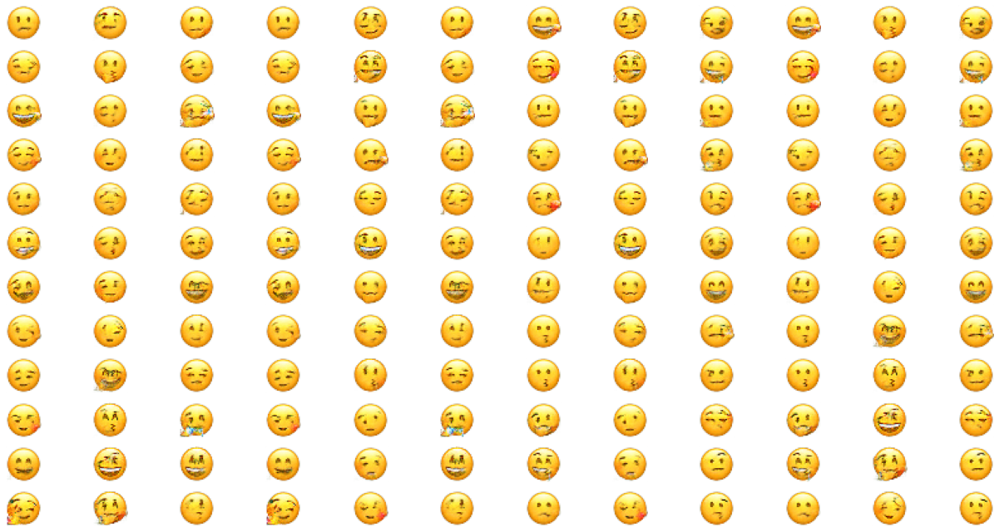

55/55 [==============================] - 6s 120ms/step - dis_loss: 0.0784 - dis_acc: 0.9531 - gen_loss: 0.6654 - gen_acc: 9.7656e-04
Epoch 152/302
55/55 [==============================] - 3s 46ms/step - dis_loss: 0.0802 - dis_acc: 0.9534 - gen_loss: 0.6684 - gen_acc: 0.0024
Epoch 153/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0803 - dis_acc: 0.9501 - gen_loss: 0.6708 - gen_acc: 0.0038
Epoch 154/302
55/55 [==============================] - 3s 46ms/step - dis_loss: 0.0775 - dis_acc: 0.9558 - gen_loss: 0.6730 - gen_acc: 8.3705e-04
Epoch 155/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0817 - dis_acc: 0.9474 - gen_loss: 0.6805 - gen_acc: 0.0036
Epoch 156/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0786 - dis_acc: 0.9530 - gen_loss: 0.6711 - gen_acc: 0.0013
Epoch 157/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0775 - dis_acc: 0.9544 - gen_loss: 0.6816 - gen_acc: 0.0018
Epoch 158/3

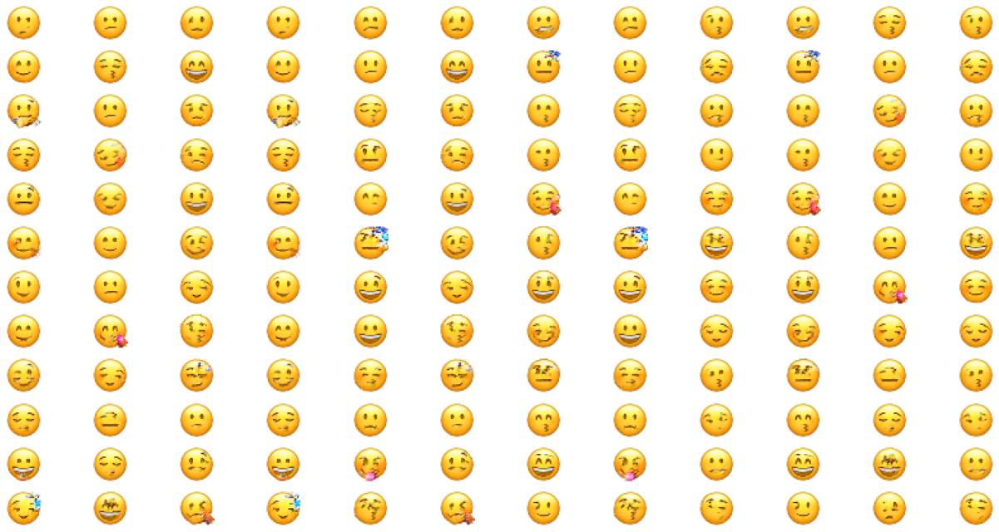

55/55 [==============================] - 6s 117ms/step - dis_loss: 0.0738 - dis_acc: 0.9492 - gen_loss: 0.7086 - gen_acc: 0.0014
Epoch 302/302
55/55 [==============================] - 3s 47ms/step - dis_loss: 0.0720 - dis_acc: 0.9533 - gen_loss: 0.7048 - gen_acc: 0.0017
CPU times: user 7min 54s, sys: 25.7 s, total: 8min 20s
Wall time: 12min 50s


In [19]:
%%time

wandb.init(name='DCGAN_GP_lr_0.0001',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302, 
          OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 1e-4, beta_1 = .5),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = True, UPSAMPLING_LAYER = False, INFO_GAN = False, 
          POS_LBL_SMOOTH = False, NEG_LBL_SMOOTH = False, ADD_NOISE = False, WGAN_LOSS = False)

dis_acc,█▆▅▅▂▁▆▆▂▄▃▇▆▄█▆▆▆▆▆▆▆▄▇▆▄▇▆▆▆▆▅▇▆▇▆▆█▇▅
dis_loss,▁▃▆▆█▇▅▅▆▅▅▄▅▄▄▄▄▄▄▄▅▃▄▃▃▄▃▄▃▃▄▄▄▃▄▃▄▃▄▄
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_acc,██▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
gen_loss,▁▁▃▅▆▇▆▆▄▅▅▇▇▆▆▇▆▅▅▆█▆▅▆▆▆▇▆▇▇█▆█▇█▆▇██▆
dis_acc,0.9375
dis_loss,0.07532
epoch,301
gen_acc,0.0
gen_loss,0.66086


Epoch 1/302
55/55 [==============================] - ETA: 0s - dis_loss: 0.7279 - dis_acc: 0.9749 - gen_loss: 0.0496 - gen_acc: 0.9308

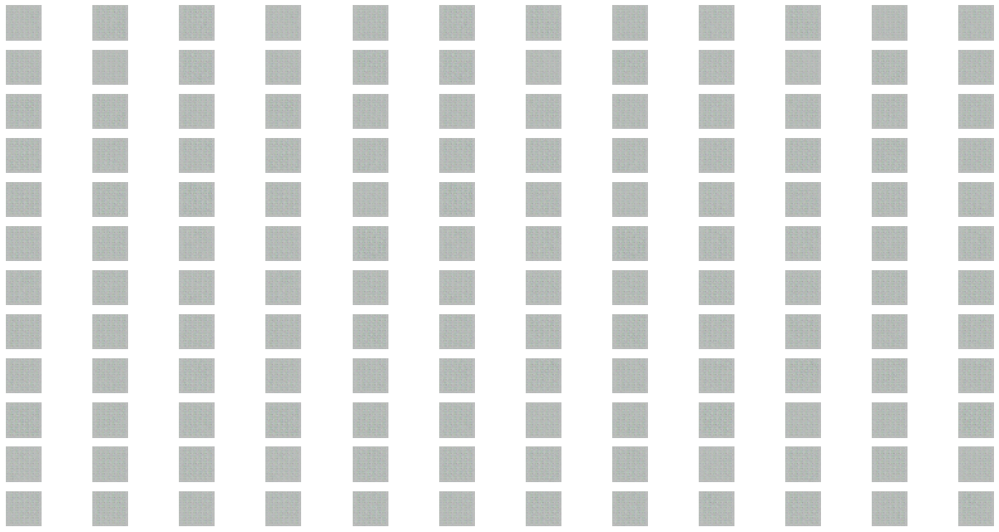

55/55 [==============================] - 8s 119ms/step - dis_loss: 0.7154 - dis_acc: 0.9754 - gen_loss: 0.0488 - gen_acc: 0.9321
Epoch 2/302
55/55 [==============================] - 3s 45ms/step - dis_loss: 0.0230 - dis_acc: 0.9995 - gen_loss: 0.0067 - gen_acc: 1.0000
Epoch 3/302
55/55 [==============================] - 2s 44ms/step - dis_loss: 0.0289 - dis_acc: 0.9992 - gen_loss: 0.0119 - gen_acc: 1.0000
Epoch 4/302
55/55 [==============================] - 2s 44ms/step - dis_loss: 0.0234 - dis_acc: 1.0000 - gen_loss: 0.0113 - gen_acc: 1.0000
Epoch 5/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0286 - dis_acc: 0.9976 - gen_loss: 0.0287 - gen_acc: 0.9831
Epoch 6/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0715 - dis_acc: 0.9714 - gen_loss: 0.1338 - gen_acc: 0.8592
Epoch 7/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.1030 - dis_acc: 0.9450 - gen_loss: 0.1521 - gen_acc: 0.8742
Epoch 8/302
55/55 [============

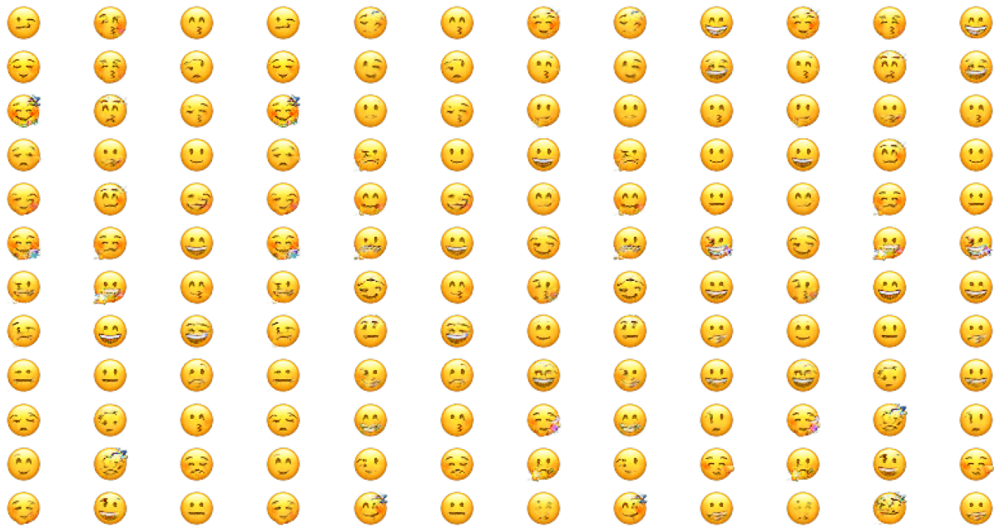

55/55 [==============================] - 6s 115ms/step - dis_loss: 0.0705 - dis_acc: 0.9507 - gen_loss: 0.7309 - gen_acc: 0.0015
Epoch 152/302
55/55 [==============================] - 3s 46ms/step - dis_loss: 0.0719 - dis_acc: 0.9493 - gen_loss: 0.7225 - gen_acc: 0.0027
Epoch 153/302
55/55 [==============================] - 2s 44ms/step - dis_loss: 0.0731 - dis_acc: 0.9439 - gen_loss: 0.7210 - gen_acc: 0.0021
Epoch 154/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0708 - dis_acc: 0.9522 - gen_loss: 0.7342 - gen_acc: 0.0011
Epoch 155/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0708 - dis_acc: 0.9488 - gen_loss: 0.7312 - gen_acc: 0.0020
Epoch 156/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0677 - dis_acc: 0.9516 - gen_loss: 0.7271 - gen_acc: 0.0012
Epoch 157/302
55/55 [==============================] - 2s 45ms/step - dis_loss: 0.0730 - dis_acc: 0.9471 - gen_loss: 0.7299 - gen_acc: 0.0014
Epoch 158/302
55/55

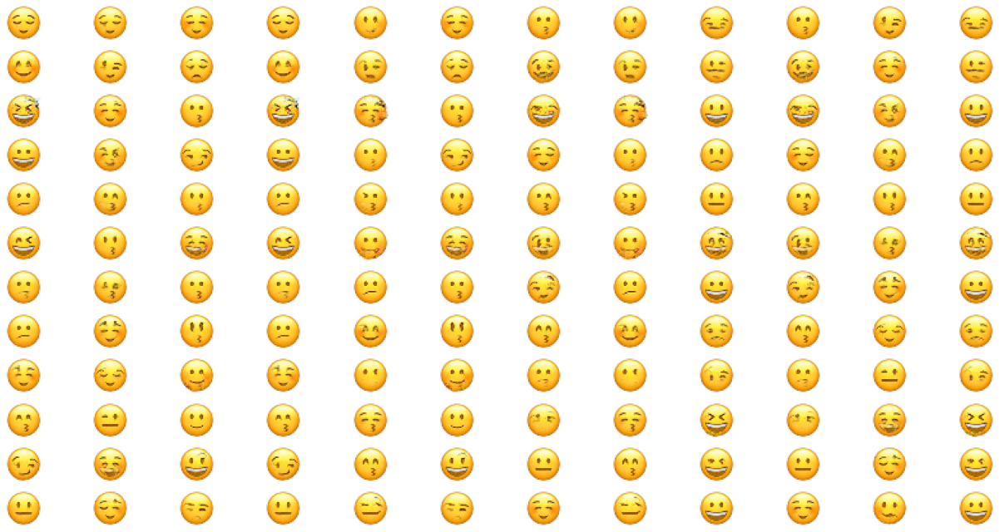

55/55 [==============================] - 6s 119ms/step - dis_loss: 0.0735 - dis_acc: 0.9238 - gen_loss: 0.7438 - gen_acc: 0.0024
Epoch 302/302
55/55 [==============================] - 3s 46ms/step - dis_loss: 0.0758 - dis_acc: 0.9219 - gen_loss: 0.7393 - gen_acc: 0.0020
CPU times: user 7min 52s, sys: 24.7 s, total: 8min 17s
Wall time: 13min 35s


In [20]:
%%time

wandb.init(name='DCGAN_GP_lr_0.0002',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302,
          OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 2e-4, beta_1 = .5),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = True, UPSAMPLING_LAYER = False, INFO_GAN = False, 
          POS_LBL_SMOOTH = False, NEG_LBL_SMOOTH = False, ADD_NOISE = False, WGAN_LOSS = False)

dis_acc,█▄▅▃▇▇▇▁▁▆▅▇▇▇▆▇▆▆▇▆▇▅▆▅▆▅▅▅▆▆▄▅▄▅▄▅▄▆▄▄
dis_loss,▁▇██▆▅▄▆▇▅▄▅▄▄▄▄▅▃▃▃▅▄▄▄▄▄▄▃▄▃▅▄▄▅▄▄▄▃▄▄
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_acc,█▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
gen_loss,▁▄▄▅▅▆▅▄▄█▅█▇▇▅▇▇▆▇█▇▆▆▆▇▇▅▇▆▇▇▆▆▇▆▇▆▇▆▇
dis_acc,0.93182
dis_loss,0.07764
epoch,301
gen_acc,0.0
gen_loss,0.68112


Epoch 1/302
55/55 [==============================] - ETA: 0s - dis_loss: 0.9375 - dis_acc: 0.9396 - gen_loss: 0.1092 - gen_acc: 0.8912

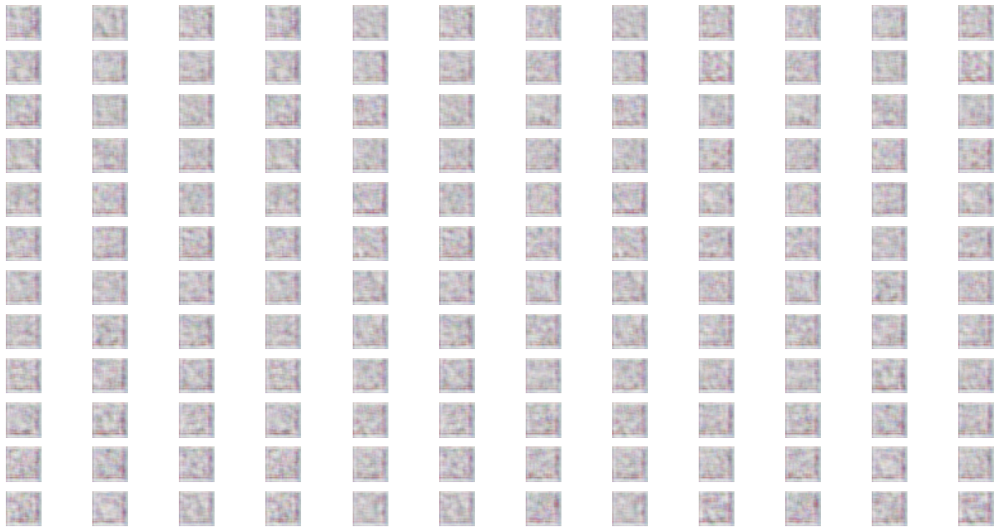

55/55 [==============================] - 9s 135ms/step - dis_loss: 0.9214 - dis_acc: 0.9407 - gen_loss: 0.1074 - gen_acc: 0.8931
Epoch 2/302
55/55 [==============================] - 3s 57ms/step - dis_loss: 0.0267 - dis_acc: 0.9998 - gen_loss: 0.0046 - gen_acc: 1.0000
Epoch 3/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.0201 - dis_acc: 1.0000 - gen_loss: 0.0027 - gen_acc: 1.0000
Epoch 4/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.0205 - dis_acc: 1.0000 - gen_loss: 0.0027 - gen_acc: 1.0000
Epoch 5/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.0309 - dis_acc: 0.9964 - gen_loss: 0.0114 - gen_acc: 0.9968
Epoch 6/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.0282 - dis_acc: 0.9994 - gen_loss: 0.0080 - gen_acc: 1.0000
Epoch 7/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.0621 - dis_acc: 0.9721 - gen_loss: 0.0779 - gen_acc: 0.9326
Epoch 8/302
55/55 [============

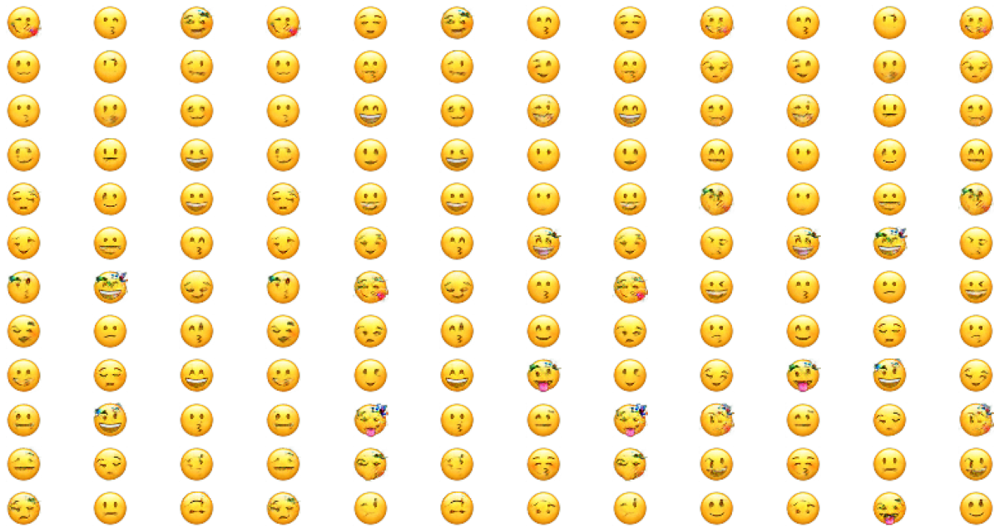

55/55 [==============================] - 7s 134ms/step - dis_loss: 0.0681 - dis_acc: 0.9564 - gen_loss: 0.7337 - gen_acc: 0.0028
Epoch 152/302
55/55 [==============================] - 3s 58ms/step - dis_loss: 0.0642 - dis_acc: 0.9647 - gen_loss: 0.7244 - gen_acc: 5.5804e-04
Epoch 153/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.0660 - dis_acc: 0.9615 - gen_loss: 0.7386 - gen_acc: 0.0017
Epoch 154/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.0678 - dis_acc: 0.9599 - gen_loss: 0.7310 - gen_acc: 0.0026
Epoch 155/302
55/55 [==============================] - 3s 57ms/step - dis_loss: 0.0652 - dis_acc: 0.9610 - gen_loss: 0.7432 - gen_acc: 0.0017
Epoch 156/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.0643 - dis_acc: 0.9636 - gen_loss: 0.7309 - gen_acc: 9.7656e-04
Epoch 157/302
55/55 [==============================] - 3s 58ms/step - dis_loss: 0.0671 - dis_acc: 0.9576 - gen_loss: 0.7430 - gen_acc: 0.0022
Epoch 158/3

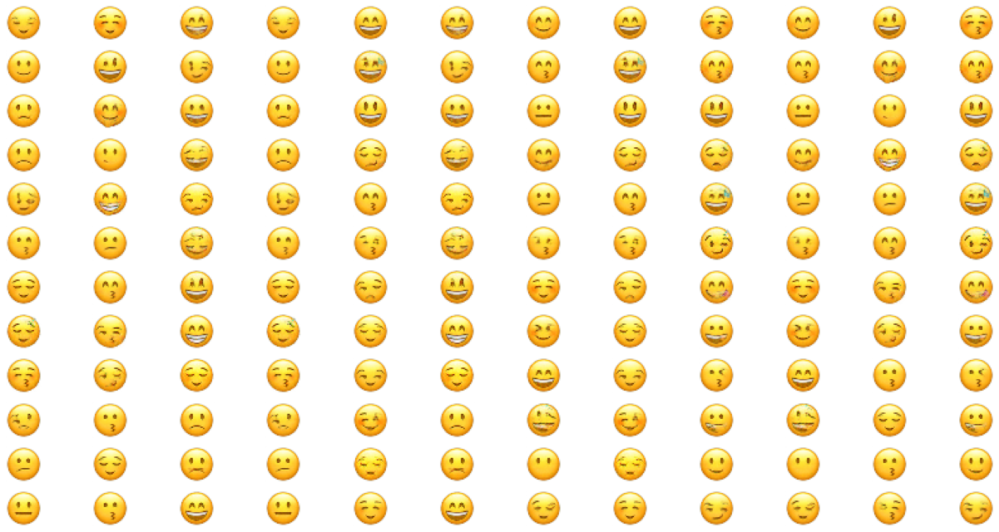

55/55 [==============================] - 7s 128ms/step - dis_loss: 0.0665 - dis_acc: 0.9395 - gen_loss: 0.7535 - gen_acc: 9.7656e-04
Epoch 302/302
55/55 [==============================] - 3s 57ms/step - dis_loss: 0.0670 - dis_acc: 0.9394 - gen_loss: 0.7571 - gen_acc: 0.0011
CPU times: user 9min 48s, sys: 26.3 s, total: 10min 15s
Wall time: 16min 35s


In [21]:
%%time

wandb.init(name='DCGAN_GP_Upsampling',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302,
          OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 2e-4, beta_1 = .5),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = True, UPSAMPLING_LAYER = True, INFO_GAN = False, 
          POS_LBL_SMOOTH = False, NEG_LBL_SMOOTH = False, ADD_NOISE = False, WGAN_LOSS = False)

Epoch 1/302
54/55 [============================>.] - ETA: 0s - dis_loss: 4.3911 - dis_acc: 0.9586 - gen_loss: 4.3837 - gen_acc: 0.7318

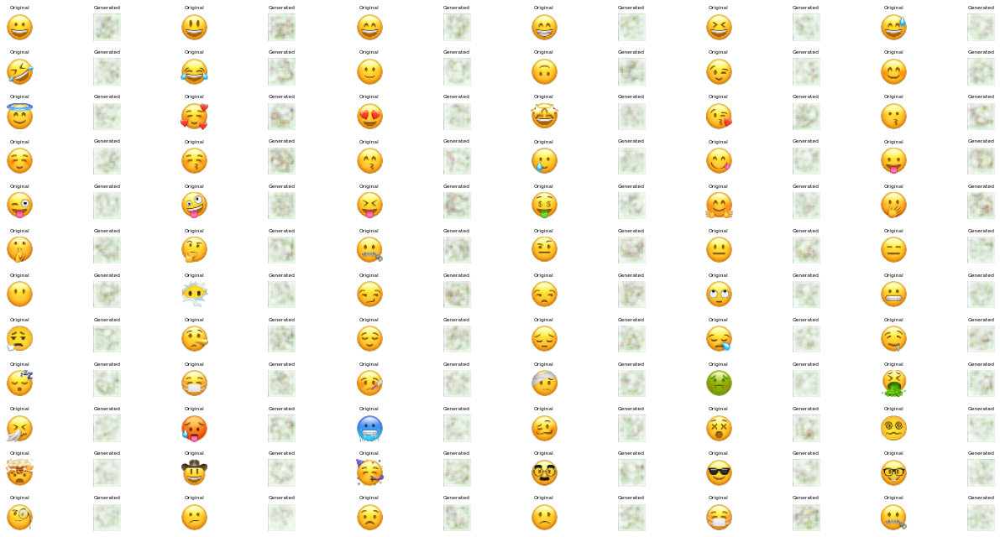

55/55 [==============================] - 10s 135ms/step - dis_loss: 4.3654 - dis_acc: 0.9590 - gen_loss: 4.3706 - gen_acc: 0.7414
Epoch 2/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 2.0896 - dis_acc: 0.9244 - gen_loss: 1.6827 - gen_acc: 0.8537
Epoch 3/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.5877 - dis_acc: 0.9180 - gen_loss: 0.1068 - gen_acc: 0.9579
Epoch 4/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.3546 - dis_acc: 0.9373 - gen_loss: 0.0557 - gen_acc: 0.9908
Epoch 5/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.2825 - dis_acc: 0.9404 - gen_loss: 0.0725 - gen_acc: 0.9794
Epoch 6/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.3206 - dis_acc: 0.9189 - gen_loss: 0.1139 - gen_acc: 0.9481
Epoch 7/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.3045 - dis_acc: 0.9189 - gen_loss: 0.1271 - gen_acc: 0.9316
Epoch 8/302
55/55 [===========

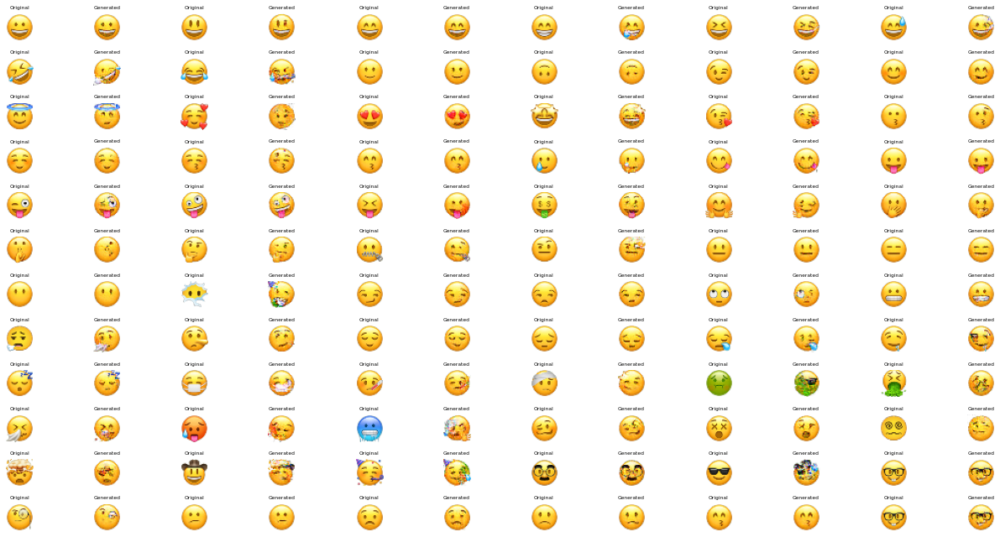

55/55 [==============================] - 8s 139ms/step - dis_loss: 0.2248 - dis_acc: 0.6501 - gen_loss: 0.4069 - gen_acc: 0.1380
Epoch 152/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.2200 - dis_acc: 0.6625 - gen_loss: 0.4304 - gen_acc: 0.1127
Epoch 153/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2239 - dis_acc: 0.6584 - gen_loss: 0.3963 - gen_acc: 0.1303
Epoch 154/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2288 - dis_acc: 0.6428 - gen_loss: 0.4060 - gen_acc: 0.1554
Epoch 155/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2240 - dis_acc: 0.6563 - gen_loss: 0.4059 - gen_acc: 0.1531
Epoch 156/302
55/55 [==============================] - 3s 59ms/step - dis_loss: 0.2290 - dis_acc: 0.6501 - gen_loss: 0.4052 - gen_acc: 0.1324
Epoch 157/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.2182 - dis_acc: 0.6760 - gen_loss: 0.4019 - gen_acc: 0.0838
Epoch 158/302
55/55

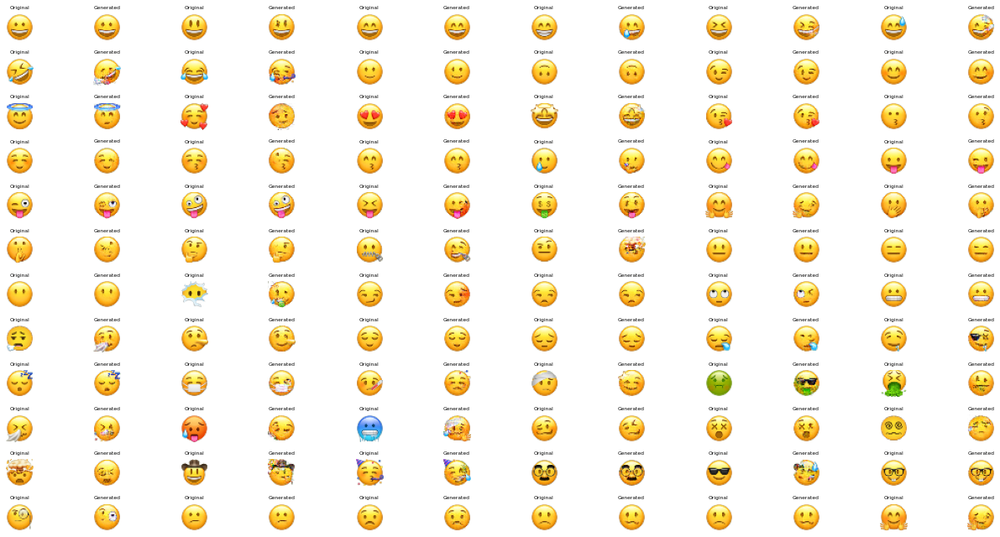

55/55 [==============================] - 7s 136ms/step - dis_loss: 0.2198 - dis_acc: 0.6502 - gen_loss: 0.4260 - gen_acc: 0.1222
Epoch 302/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.2154 - dis_acc: 0.6715 - gen_loss: 0.3993 - gen_acc: 0.1070
CPU times: user 10min 22s, sys: 34.5 s, total: 10min 57s
Wall time: 17min 37s


In [17]:
%%time 

wandb.init(name='INFOGAN_GP_Upsampling',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302, 
          OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 2e-4, beta_1 = .5),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = True, UPSAMPLING_LAYER = True, INFO_GAN = True, 
          POS_LBL_SMOOTH = False, NEG_LBL_SMOOTH = False, ADD_NOISE = False, WGAN_LOSS = False)

dis_acc,██▅▆▅▆▅▃▄▅▇▅▃▅▄▅▄▅▄▄▁▁▃▃▅▃▄▃▃▃▃▃▄▂▂▂▄▄▃▄
dis_loss,▄█▂▂▂▁▂▂▂▁▁▂▂▁▂▂▂▂▂▂▄▃▃▂▂▂▂▂▂▂▃▂▂▂▃▃▂▂▃▂
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_acc,█▅▂▁▁▁▁▁▁▇▁▁▇▁▁▁▁▁▁▇▁▇▆▇▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▄
gen_loss,▁▃▄▆█▆▆▄▇▂▄▅▂▄▄▄▄▄▄▂▆▂▃▂▄▅▅▄▅▄▄▄▄▆▆▅▄▄▅▃
dis_acc,0.66477
dis_loss,0.22122
epoch,301
gen_acc,0.34091
gen_loss,0.28606


Epoch 1/302
54/55 [============================>.] - ETA: 0s - dis_loss: 4.4143 - dis_acc: 0.9606 - gen_loss: 4.3808 - gen_acc: 0.7766

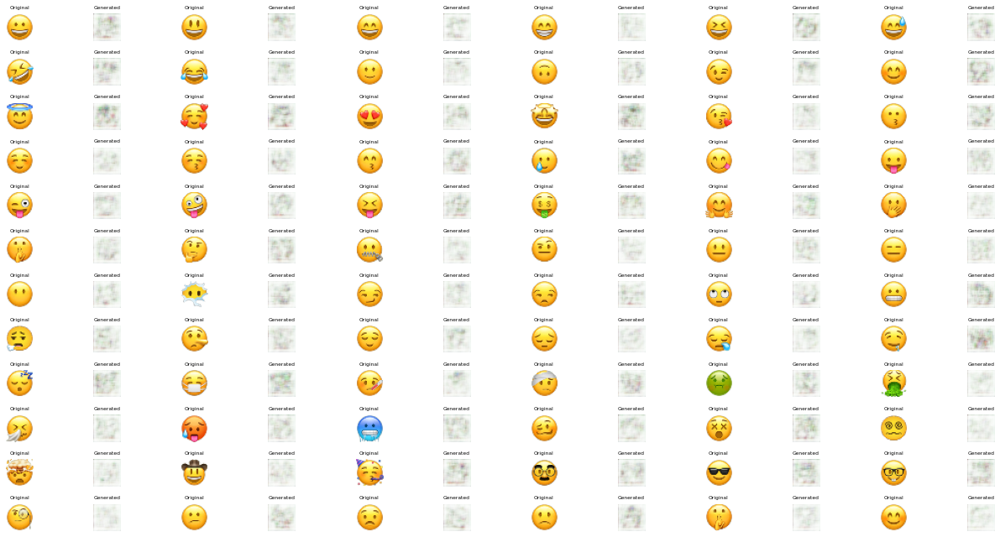

55/55 [==============================] - 16s 248ms/step - dis_loss: 4.3821 - dis_acc: 0.9616 - gen_loss: 4.3648 - gen_acc: 0.7846
Epoch 2/302
55/55 [==============================] - 4s 66ms/step - dis_loss: 2.2210 - dis_acc: 0.9318 - gen_loss: 1.5182 - gen_acc: 0.8766
Epoch 3/302
55/55 [==============================] - 3s 62ms/step - dis_loss: 0.7595 - dis_acc: 0.9244 - gen_loss: 0.1334 - gen_acc: 0.9528
Epoch 4/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.4384 - dis_acc: 0.9386 - gen_loss: 0.0774 - gen_acc: 0.9794
Epoch 5/302
55/55 [==============================] - 3s 57ms/step - dis_loss: 0.3556 - dis_acc: 0.9376 - gen_loss: 0.0947 - gen_acc: 0.9704
Epoch 6/302
55/55 [==============================] - 3s 57ms/step - dis_loss: 0.3348 - dis_acc: 0.9221 - gen_loss: 0.1684 - gen_acc: 0.8788
Epoch 7/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.2702 - dis_acc: 0.9425 - gen_loss: 0.1178 - gen_acc: 0.9692
Epoch 8/302
55/55 [===========

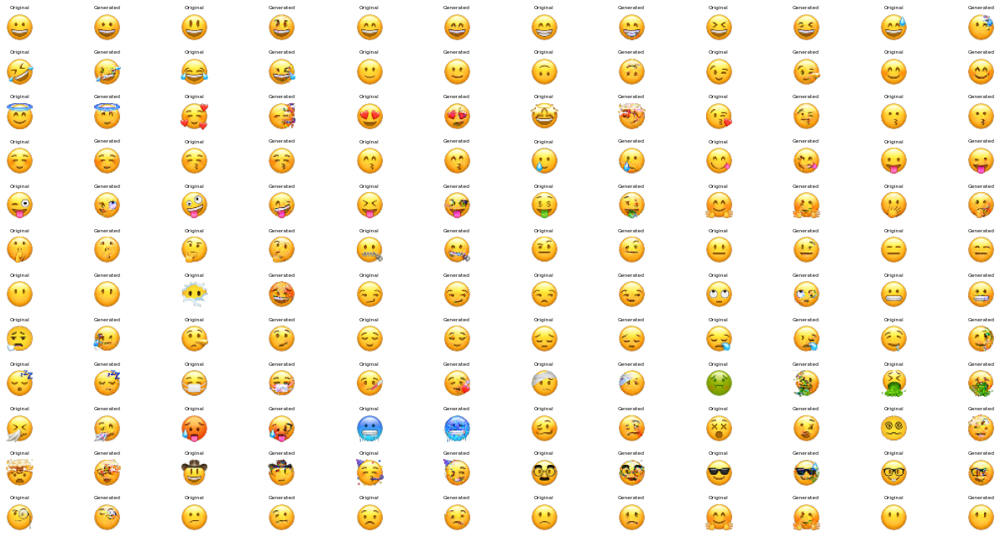

55/55 [==============================] - 7s 136ms/step - dis_loss: 0.2222 - dis_acc: 0.6693 - gen_loss: 0.4463 - gen_acc: 0.1286
Epoch 152/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.2196 - dis_acc: 0.6823 - gen_loss: 0.4469 - gen_acc: 0.1037
Epoch 153/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2247 - dis_acc: 0.6644 - gen_loss: 0.4721 - gen_acc: 0.1422
Epoch 154/302
55/55 [==============================] - 3s 59ms/step - dis_loss: 0.2193 - dis_acc: 0.6763 - gen_loss: 0.4338 - gen_acc: 0.1068
Epoch 155/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2195 - dis_acc: 0.6808 - gen_loss: 0.4572 - gen_acc: 0.0918
Epoch 156/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.2162 - dis_acc: 0.6881 - gen_loss: 0.4666 - gen_acc: 0.1020
Epoch 157/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2265 - dis_acc: 0.6626 - gen_loss: 0.4538 - gen_acc: 0.1533
Epoch 158/302
55/55

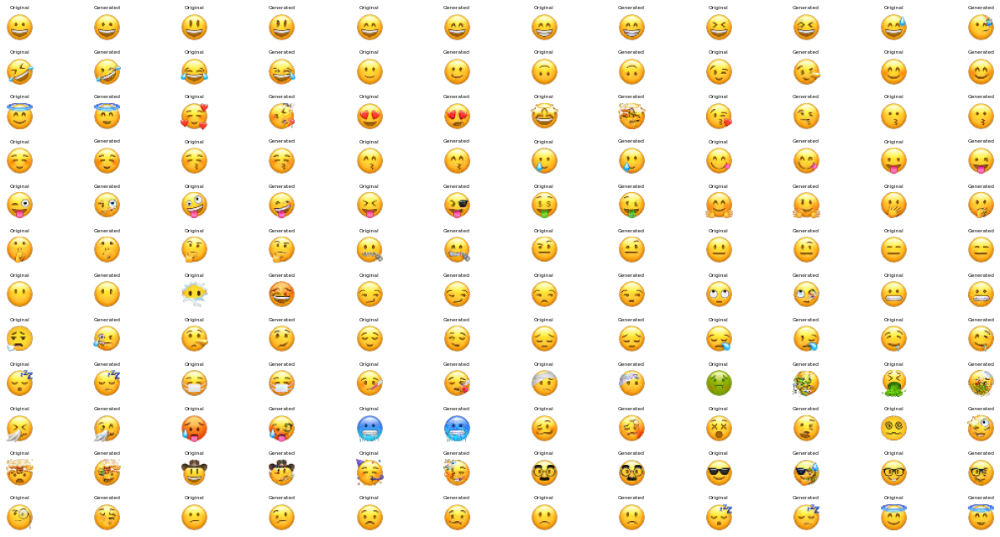

55/55 [==============================] - 7s 135ms/step - dis_loss: 0.2218 - dis_acc: 0.6642 - gen_loss: 0.4362 - gen_acc: 0.1098
Epoch 302/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.2173 - dis_acc: 0.6746 - gen_loss: 0.4907 - gen_acc: 0.0590
CPU times: user 10min 29s, sys: 36.5 s, total: 11min 5s
Wall time: 17min 36s


In [18]:
%%time

wandb.init(name='INFOGAN_GP_Upsampling_Pos_Lbl_Smooth',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302, 
          OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 2e-4, beta_1 = .5),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = True, UPSAMPLING_LAYER = True, INFO_GAN = True, 
          POS_LBL_SMOOTH = True, NEG_LBL_SMOOTH = False, ADD_NOISE = False, WGAN_LOSS = False)

dis_acc,██▇▅▄▄▅▆▄▄▃▅▄▄▂▄▂▄▃▄▃▃▄▁▃▂▃▄▄▃▁▃▄▅▃▅▃▃▃▂
dis_loss,█▂▃▁▂▂▁▁▁▂▂▂▃▂▃▂▄▂▂▁▃▁▂▄▂▃▂▁▂▂▄▁▁▁▁▁▂▁▂▂
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_acc,██▁▁▁▁▁▁▁▄▁▁▁▁▁▆▁▁█▁▁▁▁▁▇▁▁▁▁▆▁▁▁▁▁▂▆▁▁▁
gen_loss,▁▁▇▇▄█▆▅▅▃▇▅▅▆▅▃▆▄▂▆▆▄▅▅▂▅▆▆▆▃▇▄▄▄▄▄▂▅▅▄
dis_acc,0.72159
dis_loss,0.20562
epoch,301
gen_acc,0.0
gen_loss,0.56154


Epoch 1/302
54/55 [============================>.] - ETA: 0s - dis_loss: 4.3964 - dis_acc: 0.9717 - gen_loss: 4.2936 - gen_acc: 0.9201

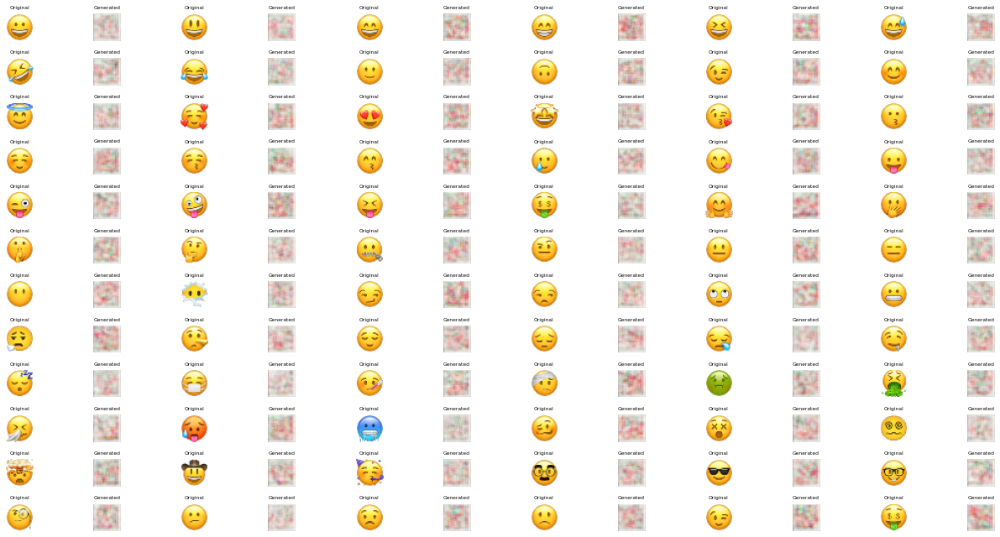

55/55 [==============================] - 9s 125ms/step - dis_loss: 4.3645 - dis_acc: 0.9725 - gen_loss: 4.2796 - gen_acc: 0.9230
Epoch 2/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 2.1577 - dis_acc: 0.9191 - gen_loss: 1.5337 - gen_acc: 0.8809
Epoch 3/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.8509 - dis_acc: 0.9103 - gen_loss: 0.1136 - gen_acc: 0.9570
Epoch 4/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.4313 - dis_acc: 0.8971 - gen_loss: 0.0802 - gen_acc: 0.9617
Epoch 5/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.4642 - dis_acc: 0.8848 - gen_loss: 0.1877 - gen_acc: 0.8365
Epoch 6/302
55/55 [==============================] - 3s 58ms/step - dis_loss: 0.2767 - dis_acc: 0.9165 - gen_loss: 0.0691 - gen_acc: 0.9890
Epoch 7/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.2522 - dis_acc: 0.9105 - gen_loss: 0.1035 - gen_acc: 0.9696
Epoch 8/302
55/55 [============

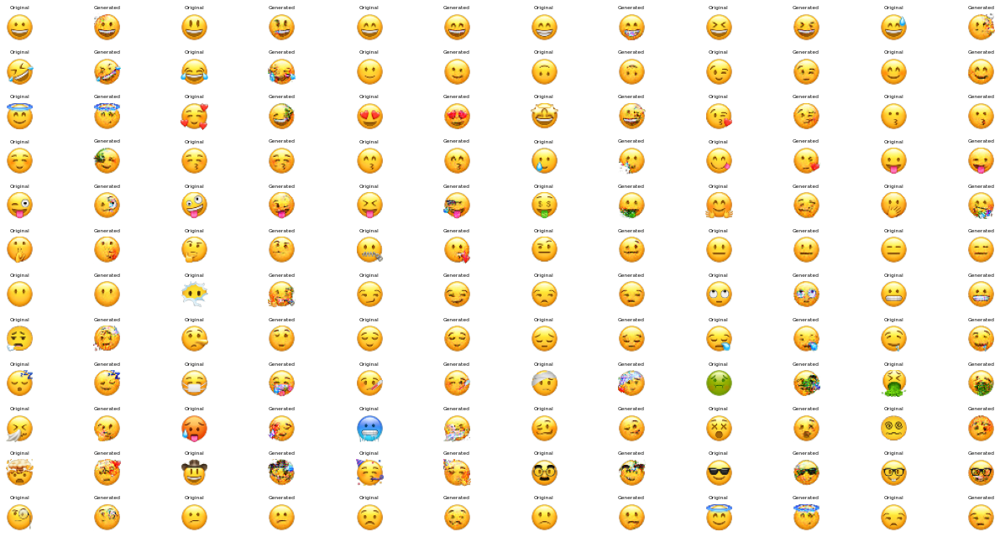

55/55 [==============================] - 7s 138ms/step - dis_loss: 0.1778 - dis_acc: 0.6730 - gen_loss: 0.3688 - gen_acc: 0.2334
Epoch 152/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.1754 - dis_acc: 0.6798 - gen_loss: 0.3657 - gen_acc: 0.2132
Epoch 153/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.1751 - dis_acc: 0.6748 - gen_loss: 0.3965 - gen_acc: 0.2126
Epoch 154/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.1718 - dis_acc: 0.6841 - gen_loss: 0.4142 - gen_acc: 0.1667
Epoch 155/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.1758 - dis_acc: 0.6783 - gen_loss: 0.3760 - gen_acc: 0.2277
Epoch 156/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.1714 - dis_acc: 0.6883 - gen_loss: 0.3915 - gen_acc: 0.1904
Epoch 157/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.1796 - dis_acc: 0.6663 - gen_loss: 0.3815 - gen_acc: 0.1913
Epoch 158/302
55/55

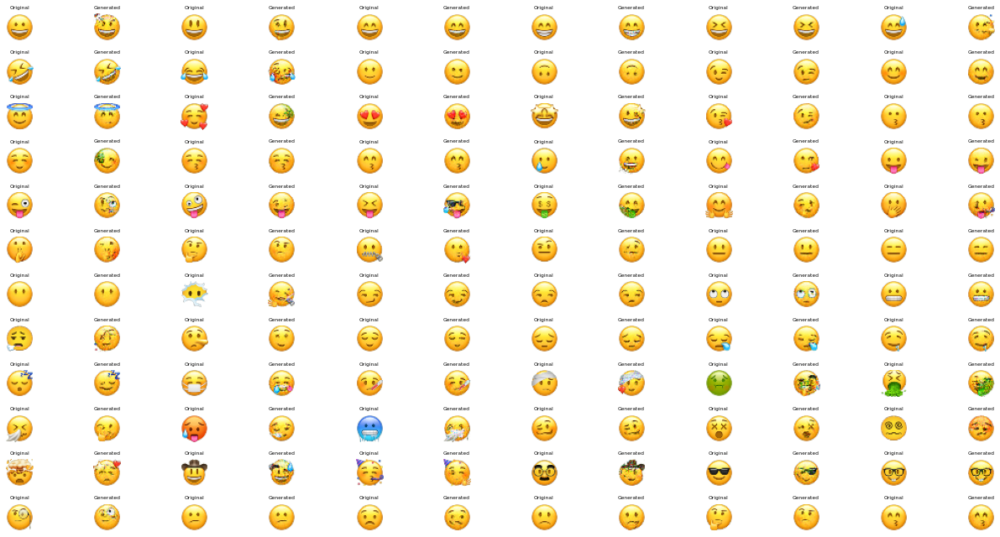

55/55 [==============================] - 8s 138ms/step - dis_loss: 0.1701 - dis_acc: 0.6805 - gen_loss: 0.3875 - gen_acc: 0.1760
Epoch 302/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.1731 - dis_acc: 0.6772 - gen_loss: 0.3874 - gen_acc: 0.1963
CPU times: user 10min 21s, sys: 34.1 s, total: 10min 55s
Wall time: 17min 37s


In [19]:
%%time

wandb.init(name='INFOGAN_GP_Upsampling_Neg_Lbl_Smooth',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302,
          OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 2e-4, beta_1 = .5),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = True, UPSAMPLING_LAYER = True, INFO_GAN = True, 
          POS_LBL_SMOOTH = False, NEG_LBL_SMOOTH = True, ADD_NOISE = False, WGAN_LOSS = False)

dis_acc,█▅▇▇█▇▆▄▆▆▁▆▅▆▅▅▅▆▃▄▂▄▃▂▅▅▅▃▂▄▅▂▃▅▅▁▄▂▄▃
dis_loss,█▆▂▂▁▂▁▂▂▂▅▂▂▂▂▂▂▂▂▂▃▂▃▃▂▂▂▂▂▃▂▃▃▂▂▄▂▃▂▂
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_acc,█▂▁▁▁▂▁▁▁▁▁▂▁▁▇▁▅▂▁█▁▅▄▁▃▂▂▁▁▇▂▁▇▁▁▁▃▁▁▁
gen_loss,▁▆█▇▅▄▅▆▅▄█▄▅▅▂▆▃▄▄▁▆▃▃▆▃▄▄▄▇▂▄▄▂▄▄█▃█▅▆
dis_acc,0.66477
dis_loss,0.18071
epoch,301
gen_acc,0.26136
gen_loss,0.32086


Epoch 1/302
54/55 [============================>.] - ETA: 0s - dis_loss: 4.4914 - dis_acc: 0.9530 - gen_loss: 4.4030 - gen_acc: 0.7883

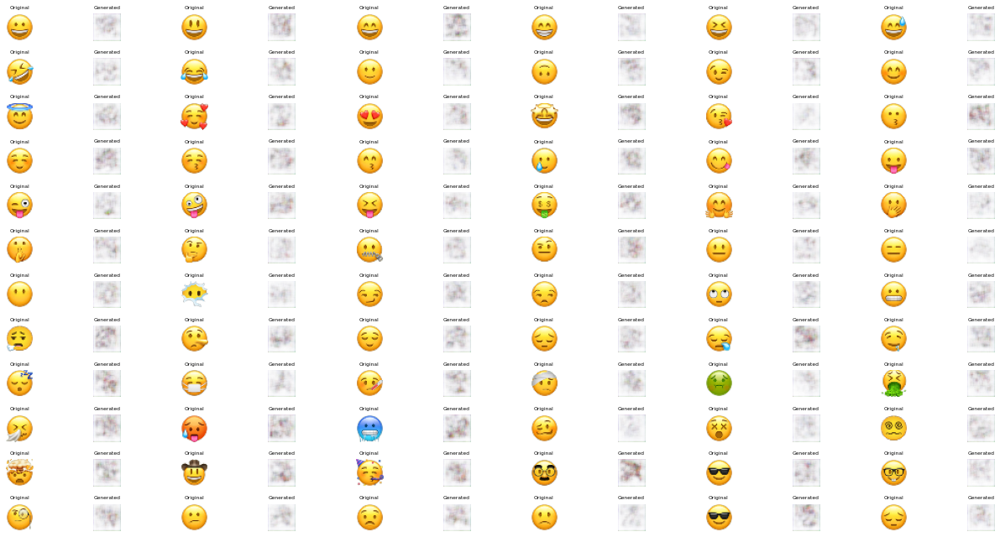

55/55 [==============================] - 9s 132ms/step - dis_loss: 4.4603 - dis_acc: 0.9547 - gen_loss: 4.3878 - gen_acc: 0.7959
Epoch 2/302
55/55 [==============================] - 3s 57ms/step - dis_loss: 2.1624 - dis_acc: 0.9028 - gen_loss: 1.5464 - gen_acc: 0.8973
Epoch 3/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.6016 - dis_acc: 0.8846 - gen_loss: 0.1145 - gen_acc: 0.9571
Epoch 4/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.3790 - dis_acc: 0.9125 - gen_loss: 0.0643 - gen_acc: 0.9920
Epoch 5/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.2996 - dis_acc: 0.9185 - gen_loss: 0.0696 - gen_acc: 0.9865
Epoch 6/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.2618 - dis_acc: 0.9239 - gen_loss: 0.0756 - gen_acc: 0.9819
Epoch 7/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.2384 - dis_acc: 0.9238 - gen_loss: 0.0812 - gen_acc: 0.9858
Epoch 8/302
55/55 [============

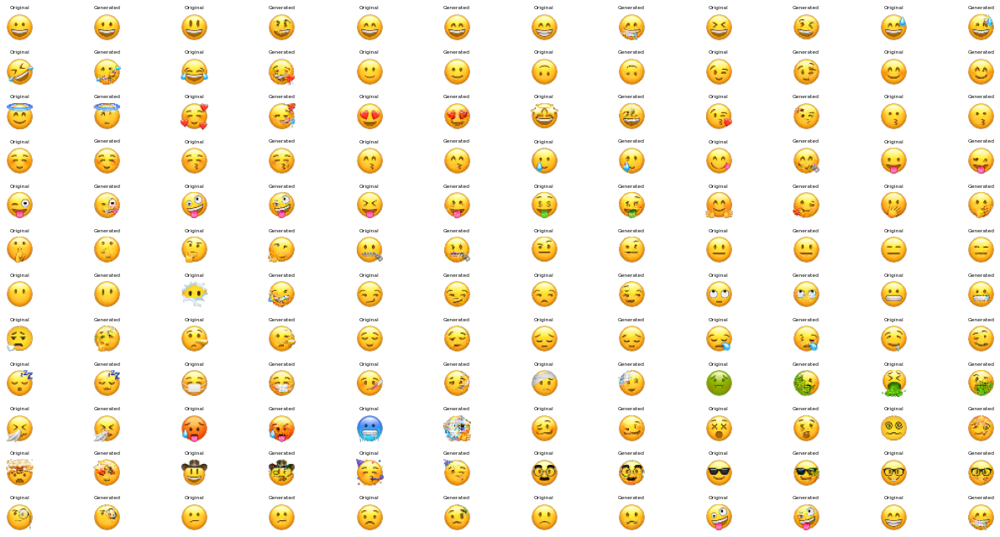

55/55 [==============================] - 8s 139ms/step - dis_loss: 0.1794 - dis_acc: 0.6858 - gen_loss: 0.3810 - gen_acc: 0.2171
Epoch 152/302
55/55 [==============================] - 3s 59ms/step - dis_loss: 0.1770 - dis_acc: 0.6919 - gen_loss: 0.3805 - gen_acc: 0.1985
Epoch 153/302
55/55 [==============================] - 3s 59ms/step - dis_loss: 0.1877 - dis_acc: 0.6647 - gen_loss: 0.3700 - gen_acc: 0.2452
Epoch 154/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.1815 - dis_acc: 0.6839 - gen_loss: 0.3670 - gen_acc: 0.1863
Epoch 155/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.1824 - dis_acc: 0.6879 - gen_loss: 0.3751 - gen_acc: 0.2087
Epoch 156/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.1777 - dis_acc: 0.6831 - gen_loss: 0.3828 - gen_acc: 0.1869
Epoch 157/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.1754 - dis_acc: 0.6982 - gen_loss: 0.3962 - gen_acc: 0.1867
Epoch 158/302
55/55

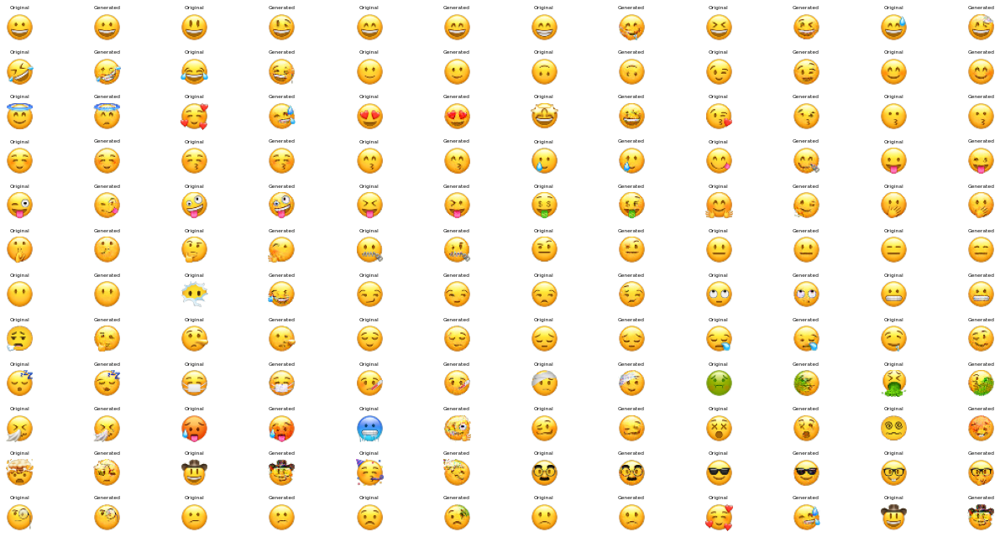

55/55 [==============================] - 7s 135ms/step - dis_loss: 0.1853 - dis_acc: 0.6486 - gen_loss: 0.3581 - gen_acc: 0.2453
Epoch 302/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.1812 - dis_acc: 0.6734 - gen_loss: 0.3556 - gen_acc: 0.2129
CPU times: user 10min 23s, sys: 36.5 s, total: 11min
Wall time: 16min 53s


In [20]:
%%time

wandb.init(name='INFOGAN_GP_Upsampling_Two_Lbl_Smooth',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302, 
          OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 2e-4, beta_1 = .5),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = True, UPSAMPLING_LAYER = True, INFO_GAN = True, 
          POS_LBL_SMOOTH = True, NEG_LBL_SMOOTH = True, ADD_NOISE = False, WGAN_LOSS = False)

dis_acc,█▇▇▇▇▆▆▆▃▂▃▄▃▅▆▁▃▄▄▅▅▅▁▃▄▄▄▅▄▁▆▃▃▄▄▃▄▄▁▃
dis_loss,█▅▂▂▁▁▁▁▂▃▂▃▂▂▁▄▃▂▂▂▁▁▃▃▃▂▂▂▂▂▁▂▂▂▁▃▂▁▃▃
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_acc,█▇▁▁▃▁▂▁▁▁▁▆▁▃▂▁█▁▂▆▁▁▁▁▇▃▄▃▁▁▂▁▁▆▁█▂▆▁▁
gen_loss,▁▃▆▇▄▇▅▅▇▆▇▃▆▄▅█▃▅▅▄▇▆▆▆▃▄▄▄▅▆▄▅▅▃▆▂▅▄██
dis_acc,0.65341
dis_loss,0.18587
epoch,301
gen_acc,0.23864
gen_loss,0.31636


Epoch 1/302
54/55 [============================>.] - ETA: 0s - dis_loss: 4.5215 - dis_acc: 0.9612 - gen_loss: 4.4206 - gen_acc: 0.8679

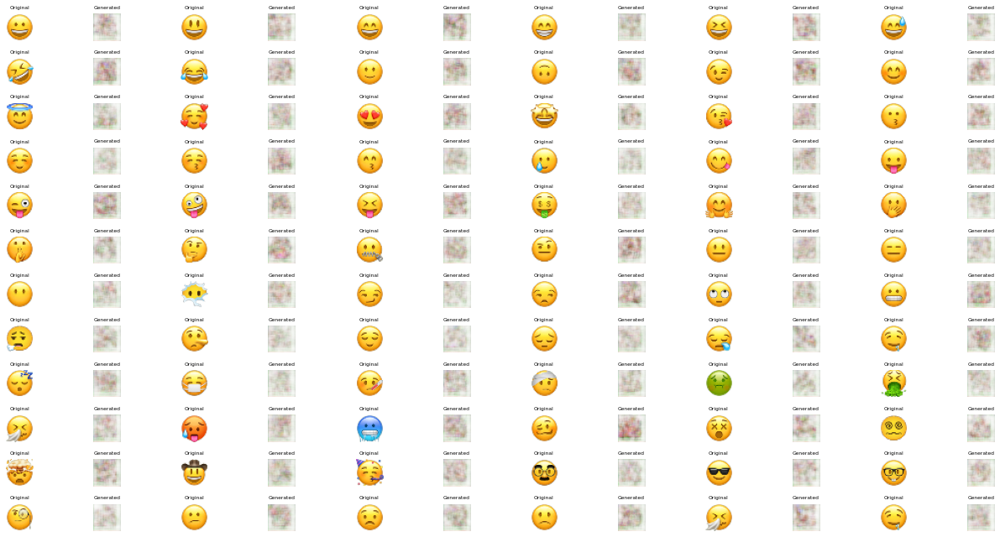

55/55 [==============================] - 10s 138ms/step - dis_loss: 4.4995 - dis_acc: 0.9616 - gen_loss: 4.4049 - gen_acc: 0.8726
Epoch 2/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 2.5664 - dis_acc: 0.8920 - gen_loss: 2.0045 - gen_acc: 0.8733
Epoch 3/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.6894 - dis_acc: 0.8536 - gen_loss: 0.1688 - gen_acc: 0.9353
Epoch 4/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.4431 - dis_acc: 0.8775 - gen_loss: 0.1360 - gen_acc: 0.9527
Epoch 5/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.3722 - dis_acc: 0.8870 - gen_loss: 0.1519 - gen_acc: 0.9321
Epoch 6/302
55/55 [==============================] - 3s 55ms/step - dis_loss: 0.3276 - dis_acc: 0.8908 - gen_loss: 0.1436 - gen_acc: 0.9467
Epoch 7/302
55/55 [==============================] - 3s 56ms/step - dis_loss: 0.3247 - dis_acc: 0.8871 - gen_loss: 0.1592 - gen_acc: 0.9278
Epoch 8/302
55/55 [===========

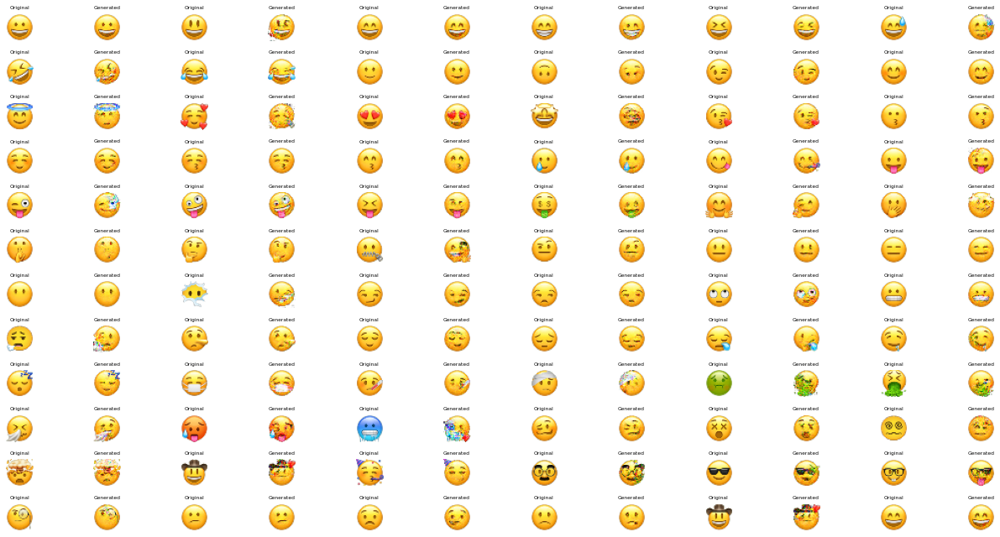

55/55 [==============================] - 7s 134ms/step - dis_loss: 0.2071 - dis_acc: 0.6372 - gen_loss: 0.3234 - gen_acc: 0.2924
Epoch 152/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.2054 - dis_acc: 0.6429 - gen_loss: 0.3370 - gen_acc: 0.2927
Epoch 153/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2065 - dis_acc: 0.6357 - gen_loss: 0.3207 - gen_acc: 0.2987
Epoch 154/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2101 - dis_acc: 0.6297 - gen_loss: 0.3158 - gen_acc: 0.3021
Epoch 155/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2099 - dis_acc: 0.6267 - gen_loss: 0.3188 - gen_acc: 0.2808
Epoch 156/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2140 - dis_acc: 0.6176 - gen_loss: 0.3074 - gen_acc: 0.3352
Epoch 157/302
55/55 [==============================] - 3s 60ms/step - dis_loss: 0.2114 - dis_acc: 0.6261 - gen_loss: 0.3047 - gen_acc: 0.3508
Epoch 158/302
55/55

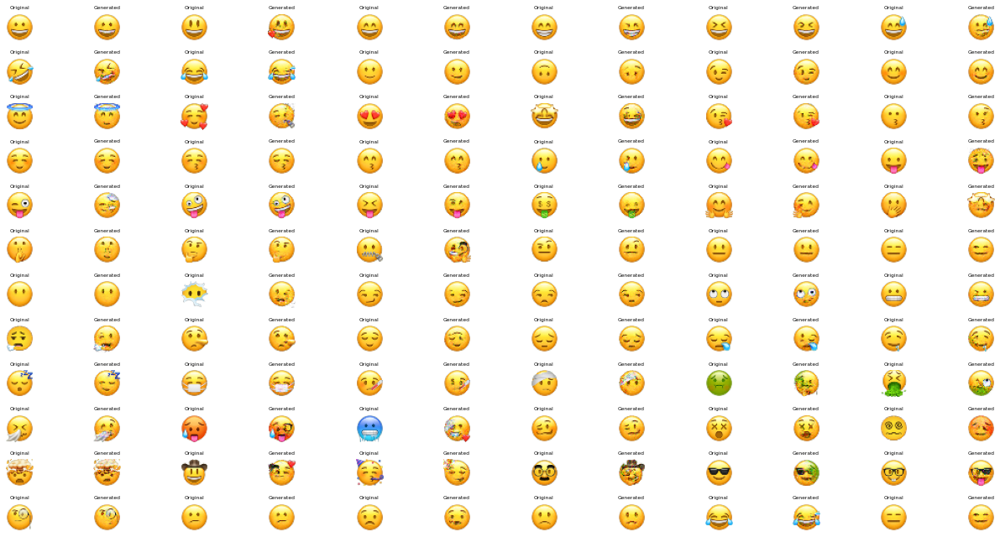

55/55 [==============================] - 7s 137ms/step - dis_loss: 0.2063 - dis_acc: 0.6286 - gen_loss: 0.3235 - gen_acc: 0.2436
Epoch 302/302
55/55 [==============================] - 3s 61ms/step - dis_loss: 0.2078 - dis_acc: 0.6189 - gen_loss: 0.3115 - gen_acc: 0.3114
CPU times: user 10min 29s, sys: 36.8 s, total: 11min 5s
Wall time: 16min 54s


In [21]:
%%time

wandb.init(name='INFOGAN_GP_Upsampling_Two_Lbl_Smooth_Add_Noise',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302,
          OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 2e-4, beta_1 = .5),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = True, UPSAMPLING_LAYER = True, INFO_GAN = True, 
          POS_LBL_SMOOTH = True, NEG_LBL_SMOOTH = True, ADD_NOISE = True, WGAN_LOSS = False)

dis_acc,█▇▆██▆▇▄▄▆▄▄▃▅▂▄▄▃▂▄▃▃▅▄▄▂▃▄▃▃▃▂▄▄▁▃▁▅▂▂
dis_loss,█▆▄▁▁▁▁▂▂▁▂▂▁▁▄▁▂▄▂▂▂▃▂▃▂▃▃▂▃▃▂▂▂▂▃▃▃▂▄▃
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_acc,██▁▁▄▁▃▁▃▂▁▂▁▆▁▁▁█▁▄▁▂▂▆▁▁▆▁▁▁▃▁▁▁▄▁▁▇▇▆
gen_loss,▁▁▇▆▃▇▅▆▄▄▅▅▅▃█▅▆▂▄▄█▄▄▃▅▄▃▅▆▅▄▇▅▅▃▅▆▃▃▄
dis_acc,0.55682
dis_loss,0.2652
epoch,301
gen_acc,1.0
gen_loss,0.12181


Epoch 1/302
54/55 [============================>.] - ETA: 0s - dis_loss: -88.6158 - dis_acc: 0.2668 - gen_loss: -85.6664 - gen_acc: 0.0000e+00

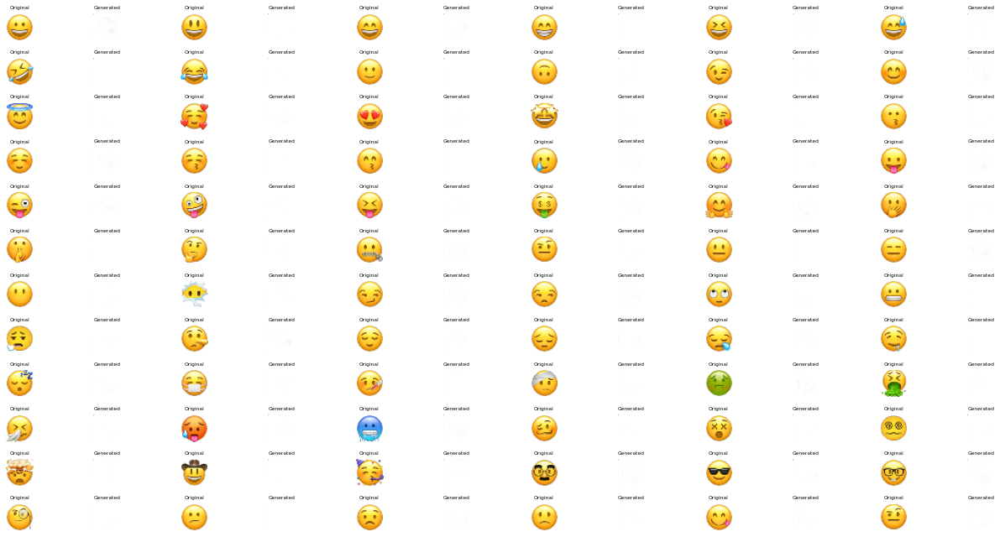

55/55 [==============================] - 10s 139ms/step - dis_loss: -94.9318 - dis_acc: 0.2573 - gen_loss: -87.0895 - gen_acc: 0.0000e+00
Epoch 2/302
55/55 [==============================] - 3s 58ms/step - dis_loss: -174.7705 - dis_acc: 0.0077 - gen_loss: -105.9377 - gen_acc: 0.0000e+00
Epoch 3/302
55/55 [==============================] - 3s 57ms/step - dis_loss: -73.6150 - dis_acc: 0.1268 - gen_loss: -66.9305 - gen_acc: 0.0000e+00
Epoch 4/302
55/55 [==============================] - 3s 60ms/step - dis_loss: -9.2153 - dis_acc: 0.3944 - gen_loss: -36.2464 - gen_acc: 0.0000e+00
Epoch 5/302
55/55 [==============================] - 3s 57ms/step - dis_loss: -6.2902 - dis_acc: 0.4450 - gen_loss: -37.1405 - gen_acc: 0.0000e+00
Epoch 6/302
55/55 [==============================] - 3s 57ms/step - dis_loss: -4.8050 - dis_acc: 0.4673 - gen_loss: -36.0207 - gen_acc: 0.0000e+00
Epoch 7/302
55/55 [==============================] - 3s 57ms/step - dis_loss: -1.5438 - dis_acc: 0.5006 - gen_loss: -32.890

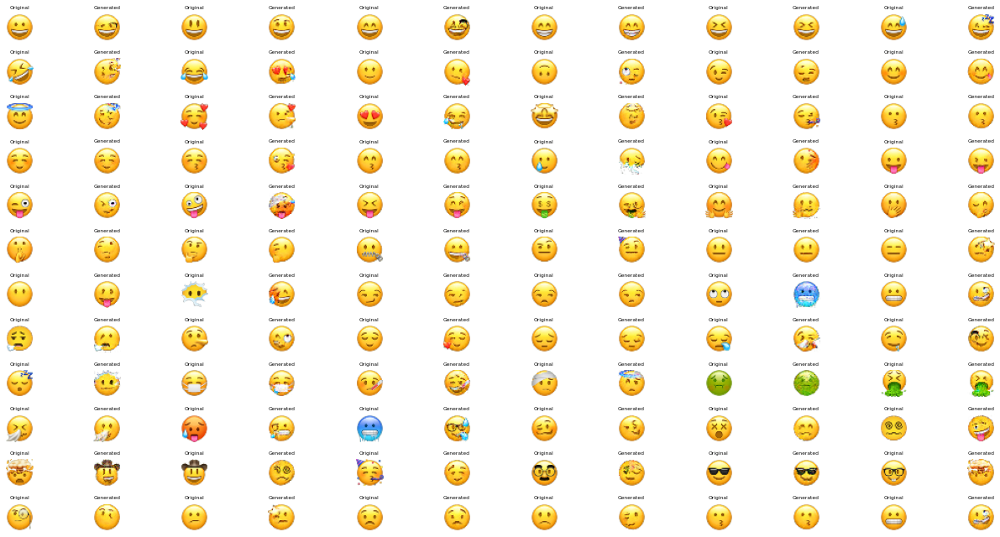

55/55 [==============================] - 8s 139ms/step - dis_loss: -1.4285 - dis_acc: 0.4629 - gen_loss: -3.3718 - gen_acc: 0.2440
Epoch 152/302
55/55 [==============================] - 3s 62ms/step - dis_loss: -1.2699 - dis_acc: 0.4683 - gen_loss: -3.6854 - gen_acc: 0.1967
Epoch 153/302
55/55 [==============================] - 3s 61ms/step - dis_loss: -1.3143 - dis_acc: 0.4637 - gen_loss: -3.8053 - gen_acc: 0.2095
Epoch 154/302
55/55 [==============================] - 3s 61ms/step - dis_loss: -1.5088 - dis_acc: 0.4617 - gen_loss: -3.5610 - gen_acc: 0.2331
Epoch 155/302
55/55 [==============================] - 3s 60ms/step - dis_loss: -1.5650 - dis_acc: 0.4555 - gen_loss: -1.8326 - gen_acc: 0.3083
Epoch 156/302
55/55 [==============================] - 3s 61ms/step - dis_loss: -1.2912 - dis_acc: 0.4636 - gen_loss: -1.9623 - gen_acc: 0.2833
Epoch 157/302
55/55 [==============================] - 3s 61ms/step - dis_loss: -1.2564 - dis_acc: 0.4643 - gen_loss: -2.0175 - gen_acc: 0.3285
Epoch

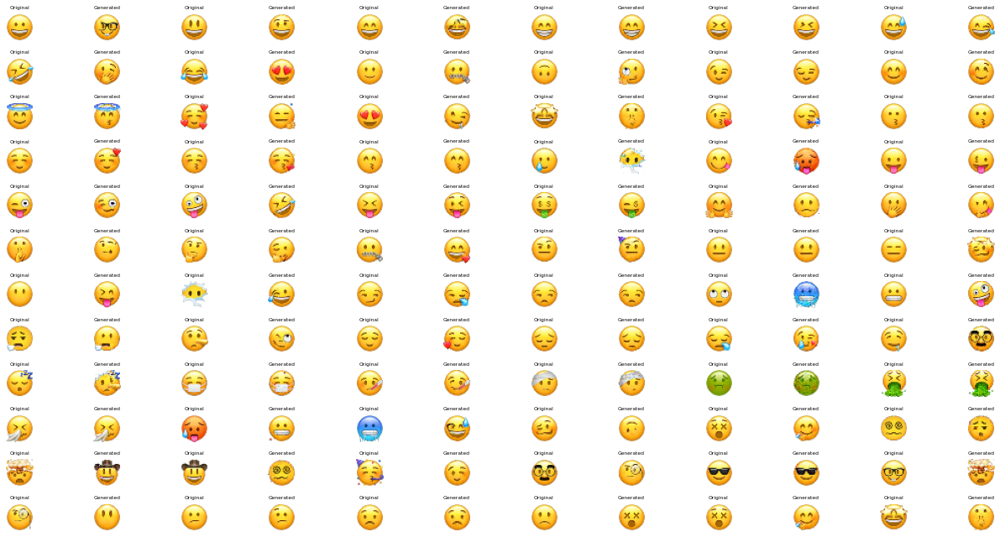

55/55 [==============================] - 7s 136ms/step - dis_loss: -0.7275 - dis_acc: 0.4752 - gen_loss: -1.9507 - gen_acc: 0.3203
Epoch 302/302
55/55 [==============================] - 3s 62ms/step - dis_loss: -0.8028 - dis_acc: 0.4760 - gen_loss: -2.9003 - gen_acc: 0.1831
CPU times: user 10min 42s, sys: 37 s, total: 11min 19s
Wall time: 17min 36s


In [22]:
%%time

wandb.init(name='INFOGAN_GP_Upsampling_WGAN',project="MP3_Ans2&3")

benchmark(X_train = r_train_images, y_train = r_train_labels, 
          BATCH_SIZE = 128, EPOCHS = 302, 
          OPTIMIZER = tf.keras.optimizers.RMSprop(5e-4),
          LATENT_DIM = 100, NUM_CLASS = 70, UNIFORM_DIM = 5, 
          GRADIENT_PENALTY = True, UPSAMPLING_LAYER = True, INFO_GAN = True, 
          POS_LBL_SMOOTH = False, NEG_LBL_SMOOTH = False, ADD_NOISE = False, WGAN_LOSS = True)